In [1]:
%load_ext autoreload
%autoreload 2

# Dataset explanation

For our project, we've selected a dataset constructed from internal email exchanges within a large European research institution. The dataset captures anonymized records of all emails sent between members of the institution. In the corresponding network, an edge
$(u,v)$ exists whenever person $u$ sent at least one email to person $v$. Because the data only includes communication among institutional members, it represents a closed network without any external incoming or outgoing messages.

An important feature of this dataset is the availability of “ground-truth” community labels. Each individual belongs to exactly one of the institution’s 42 departments, providing predefined community memberships that can be used to evaluate our community detection methods.

The dataset can be accessed from the following link (https://snap.stanford.edu/data/email-Eu-core.html), or downloaded and put inside the correct folder by executing the following cell.



In [2]:
from utils import download_data

files = [
    "email-Eu-core.txt.gz",
    "email-Eu-core-department-labels.txt.gz"
]

# download_data('twitch', "https://github.com/Carda01/community_detection/releases/download/1.0/", ['twitch_data.zip'], category='twitch')
# download_data('email', "https://snap.stanford.edu/data/", files, category='email')

# Preliminary analysis

For the following preliminary analysis we made the graph undirected, so as long as there is an edge between u and v (no matter the direction), in the newly built undirected graph there will be an edge between u and v. Also we've removed from the graph those nodes which have just self loops and no other edges to other nodes.


In [3]:
from utils import *

G = load_email()
show_mail_graph(G, k_core=5)

Calculating and adding node attribute 'degree'...


alt.LayerChart(...)

### Spy Plot

The sparsity plot (spyplot) of the adjacency matrix with the nodes ordered by their department is a sanity check.

If we get diagonal blocks it means that people inside their department sends each other a lot of mails, while they tend to send few to people of other departments.
And this is actually what we get. At the same time, there are some people (from departments 32-37 and especially department 36) who sends email to all the people. Our hypothesis is that they are the
managers or system admin department. We can already predict that it will be hard for these departments to separate them into their respective communities.
Additionally, we can notice that the communities vary drastically in size, and some are very small, like the 18th or the 12th.

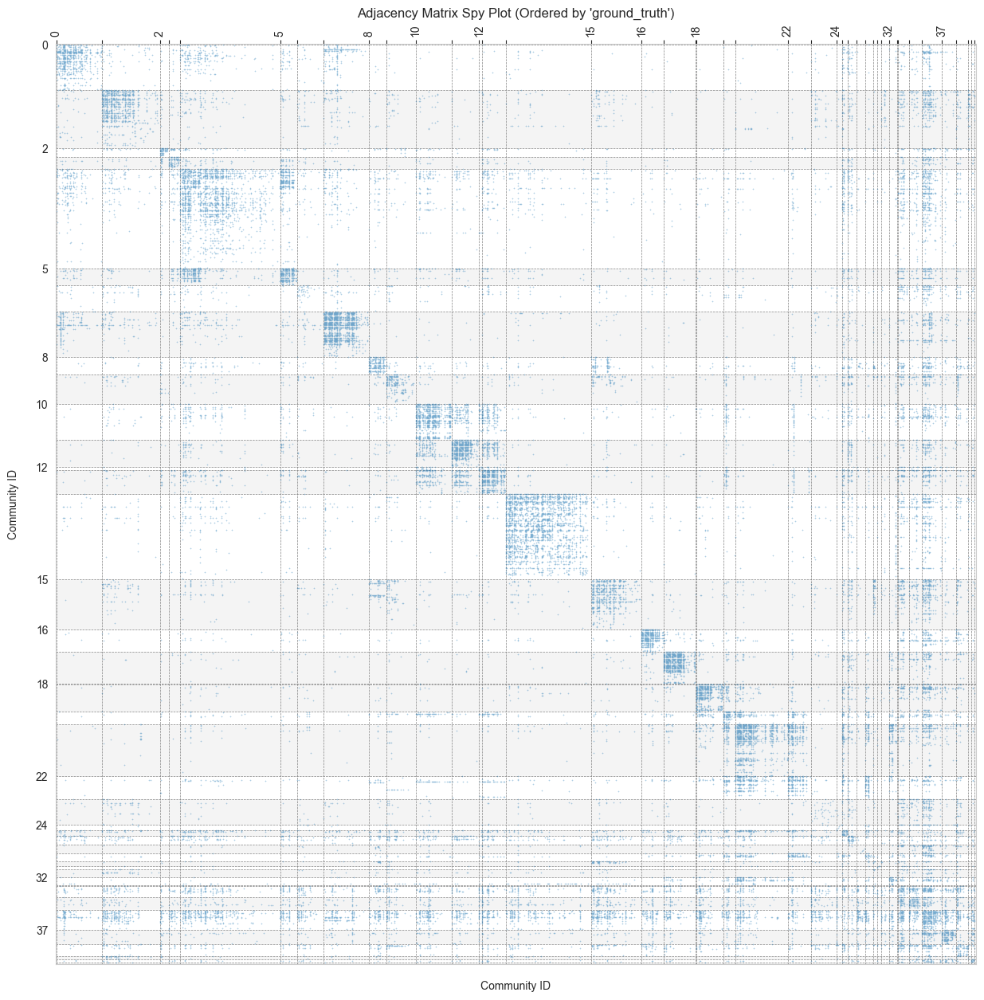

In [4]:
from utils import *

spy_plot_adjacency(G)

### General statistics
From the values of the diameter and the avg shortest path length, we can say that the network exhibits the classic "small-world" property. The degree distribution is
heavily right-skewed. It also indicates the presence of few highly connected nodes (hubs) whose degrees extend towards 350. The network's communication flow is largely
driven by these hubs (likely managers, system admins, or highly collaborative individuals), while the majority of nodes have lower connectivity.

The Clique Size (k) Distribution plot shows a roughly normal (bell-shaped) distribution centered around $k \approx 9$ to 10. This suggests a strong, consistent tendency
for nodes to organize into tightly connected, medium-sized groups (cliques). This is a strong indicator of robust community structure. Also, this can be noticed by the
high value of the clustering coefficient. In a random graph it is rougly equal to the density, but here we have $0.4 \gg 0.03$.


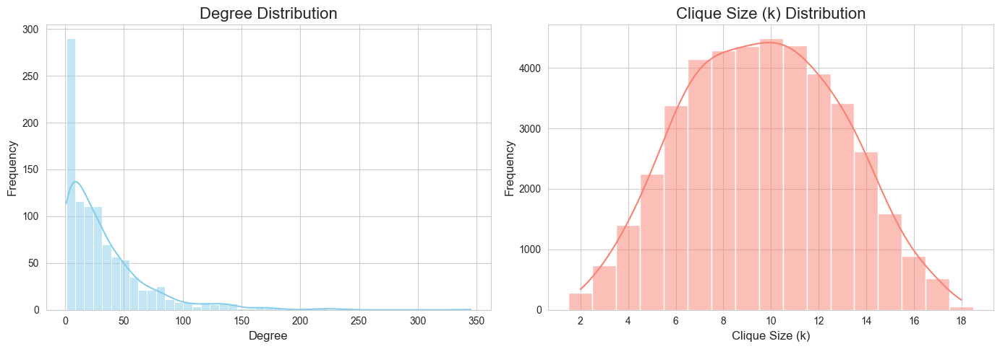

Number of nodes: 986
Number of edges: 16064
Average degree: 32.58
Density: 0.0331
Average clustering coefficient: 0.4071
Graph is connected.
Radius: 4
Diameter: 7
Average shortest path length: 2.59


In [5]:
hist_degrees_cliques(G)
summary_stats(G)

### Assortativity and Departmental Roles

We previously noted that some departments (like 36) seem to email everyone.
The assortativity coefficients quantify this behavior; it is positive if vertices of the same department tend to connect to each,
and negative otherwise.

We can see that it reveals a dichotomy in organizational behavior:

High Homophily: Departments 14, 17, 7, and 16 exhibit very high assortativity (>0.4). This implies a "Silo effect."
Members of these departments communicate predominantly with one another. In our context, these might be specialized research
labs or distinct administrative units that do not require frequent external coordination.

Zero/Low Homophily: Department 36 (and to a lesser extent 38, 6, 32) has an assortativity coefficient near zero.
This mathematically confirms the suspicion that they are managers or system admins. Their communication is
disassortative or neutral relative to their own group. They exist to serve the rest of the network rather than their own internal cluster.


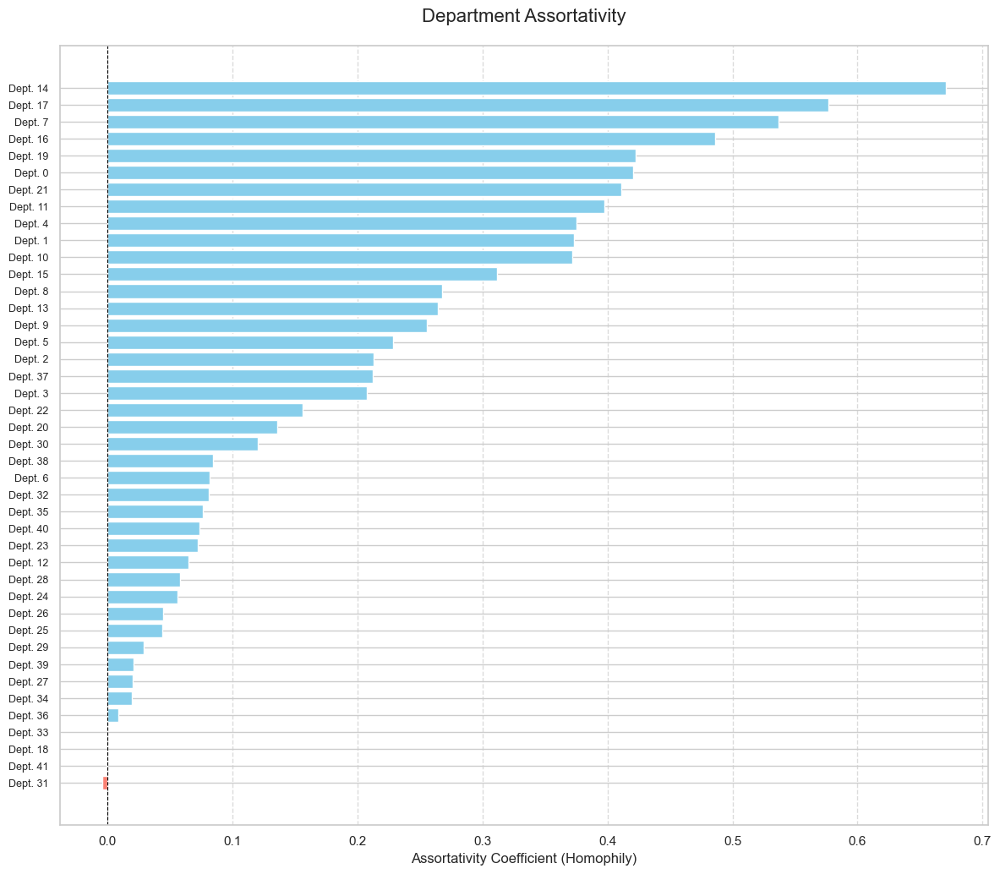

In [6]:
assortativity = calculate_department_assortativity(G)
visualize_assortativity(assortativity)


# Centrality Measures



In [7]:
import networkx as nx
from utils import *

centralities = calculate_centrality_metrics(G, [nx.pagerank, nx.betweenness_centrality, nx.closeness_centrality, nx.eigenvector_centrality])

Calculating and adding node attribute 'pagerank'...
Calculating and adding node attribute 'betweenness_centrality'...
Calculating and adding node attribute 'closeness_centrality'...
Calculating and adding node attribute 'eigenvector_centrality'...


### Betweenness centrality

Out of the top 20 nodes by Betweenness, roughly half belong to Department 36. We can imagine Department 36 as the dense "Core" that
holds the network together.

Also Node 160 is more than 2x as central as the next closest node. Removing Node 160 would likely drastically increase the Average Shortest
Path Length or even fragment the network components.


In [8]:
show_top_nodes_by_centrality(centralities, 'betweenness_centrality')

,Node,Ground Truth,betweenness_centrality
160,160,36,0.090821
86,86,36,0.039261
5,5,25,0.032203
82,82,36,0.028967
121,121,36,0.028927
107,107,36,0.025289
13,13,26,0.024483
377,377,7,0.024078
62,62,36,0.023387
64,64,25,0.022778


### Centrality Rank Dissonance

The Rank Comparison Heatmap reveals that high betweenness does not always correlate with
high centrality in other metrics. This allows us to classify nodes into specific roles:

Those who have rank concordance: e.g. Node 160 (Dept 36). It is Rank #1 across all metrics (Pagerank, Betweenness, Closeness,
Laplacian, Eigenvector). Hence, this node is not just a bridge; it is the gravitational center of the graph. It lies on the shortest paths
(Betweenness), is close to everyone (Closeness), and is connected to other highly connected nodes (Eigenvector).
This node likely represents a central mailing list or a chief administrator.

Those who have rank dissonance: e.g. Node 952 (Dept 32) and Node 377 (Dept 7). These node acts as bridges.
They connect distinct communities (hence high Betweenness) but they are not themselves embedded
in a dense, high-status clique (hence low Eigenvector). They likely connect a peripheral department (like Dept 32 or 7) to the core network.
So in general, being a "broker" (Betweenness: controlling flow) does not guarantee you are "popular" (Eigenvector:
talking to other popular people).



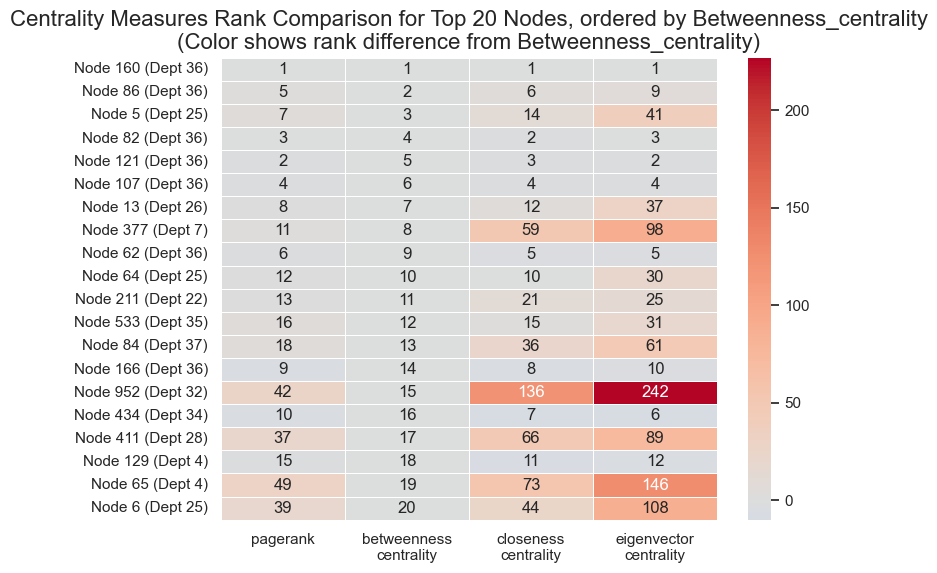

In [9]:
visualize_top_n_centrality(centralities, 'betweenness_centrality')

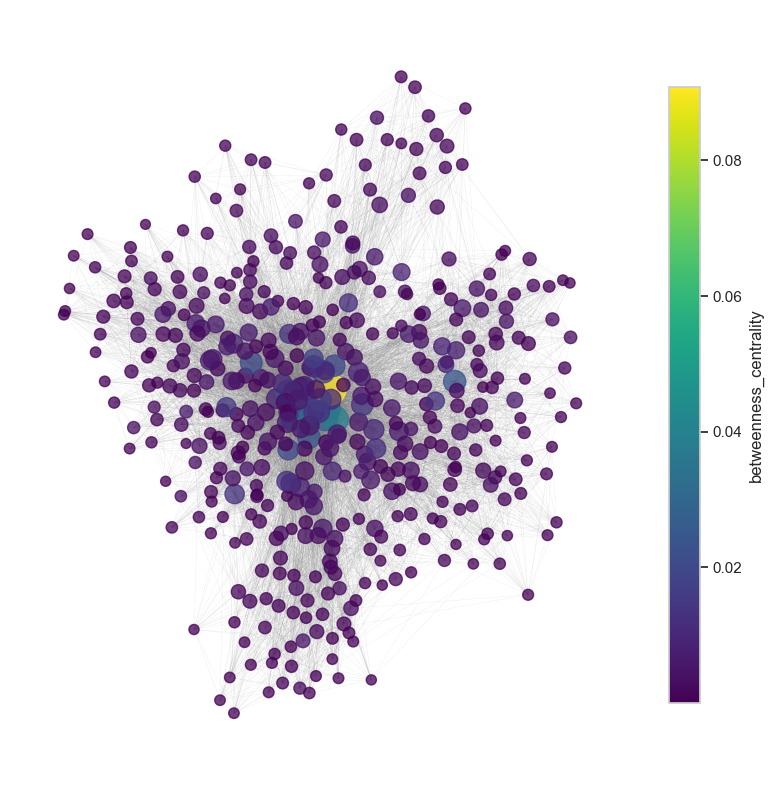

In [10]:
generic_show_static(G, node_color='betweenness_centrality',
             node_size='pagerank',
             k_core=20,
             layout_func=nx.spring_layout)


# Community detection
bla bla bla fill this


# Influence Maximization
We consider a scenario in which the EU research institution aims to identify internal security vulnerabilities.
If a malicious actor compromises a single user's email account, they can leverage established organizational trust to propagate malicious
content to colleagues in a cascading attack. Consequently, our objective is to identify the users who represent the highest risk,
specifically, those whose compromise would result in the widest dissemination of the threat. Formally, this is an Influence Maximization
problem, where we aim to identify the optimal seed set S that maximizes the spread of influence across the network.

In [11]:
from utils import *
G = load_email(directed=False)

### The algorithm
We adopted a probabilistic approach for modeling influence spread, specifically utilizing the Independent Cascade (IC) model
rather than the deterministic Threshold model.

Our hypothesis posits that an individual's decision to open a malicious email and follow links is inherently uncertain,
making it more accurately represented by a probability. In the IC model, when a node (person) becomes activated (infected),
it attempts to activate its neighbors with a certain probability p, which aligns better with this uncertainty.

One issue in this case, is that the spread function $\sigma$ is not deterministic as it was in the threshold model we saw in class.
This means we cannot inherently guarantee the submodularity property, which is crucial for proving the performance bound of the simple
Greedy algorithm.

To approximate a submodular spread function, we employ a Monte Carlo (MC) simulation approach. The spread is estimated by running the
influence propagation M times (controlled by the parameter MC_SIMULATIONS) and taking the mean of the results:

$\sigma(S) \approx \frac{1}{M}\Sigma_{i = 1}^{M} |Activated_i(S)|$

This averaging technique provides a good approximation of the true expected spread, for big MC_SIMULATIONS (e.g. >1000).

Additionally, as the process was quite slow, we've decide to parallelize the run of MC simulations,
so running our code in a laptop with many CPUs, can make the run incredibly fast.
Unfortunately we did not find a library that implemented influence maximization as we want it. So we've created it from scratch.

We've looked at SOTA methods to do influence maximization and we've found that CELF:

J. Leskovec, A. Krause, C. Guestrin, C. Faloutsos, J. VanBriesen, and N. S. Glance, "**Cost-Effective Outbreak Detection in Networks**," *Proceedings of the 21st International Conference on Neural Information Processing Systems (NIPS)*, 2007.

 was one of them. It is an optimization to the Greedy approach
we've looked at in class, that once it found the first node in the seed, it re-evaluates the marginal gain only for the top candidate
 and a few nodes that move up in the ranking, compared to the naive greedy algorithm that looks at all the other nodes again.
We've used this blog post as inspiration (https://hautahi.com/im_greedycelf), however we found different
logical errors in it and made some great improvements on it, (for example a node in this implementation could activate more than once,
if it was neighbour of two newly activated nodes).

At the end, we discovered that in our case the naive greedy worked better for us, as it was faster. The reason is that we've also parallelized
the function that get the spread of the seeds, so it finds the spread for multiple seeds at the same time.
The CELF optimization is inherently sequential. It must calculate the spread of the single top candidate, update the list, and repeat until convergence.
This sequential dependency limits the potential for substantial parallel speedup.
While brute forcing for all the possible seeds generated, by adding a node to the current seed,
can actually be parallelized, and in our case for our networks, runs faster. But if this code is run in machine with just a CPU,
then instead of using greedy, the function celf will probably achieve better performances. Both are implemented and can be used.

In [12]:
P_INFLUENCE = 0.05
MC_SIMULATIONS = 10
BUDGET = 5

seeds, final_spread = greedy(G, k=BUDGET, p=P_INFLUENCE, mc=MC_SIMULATIONS)
# seeds, final_spread = celf(G, k=BUDGET, p=P_INFLUENCE, mc=MC_SIMULATIONS)

print("-" * 50)
print(f"Optimal Seed Set S: {seeds}")
print(f"Estimated Total Spread: {final_spread:.2f} users, so {final_spread/G.number_of_nodes() * 100:.1f}% of the users")
print("-" * 50)


[Starting Greedy] Target seeds: 5 | Simulations: 10 | p: 0.05
  > Finding seed 1/5 (evaluating 986 nodes)...


  0%|          | 0/986 [00:00<?, ?it/s]

  > Seed 1 found: Node 44 (Marginal Gain: 550.10) | Total Spread: 550.10
  > Finding seed 2/5 (evaluating 985 nodes)...


  0%|          | 0/985 [00:00<?, ?it/s]

  > Seed 2 found: Node 833 (Marginal Gain: 7.40) | Total Spread: 557.50
  > Finding seed 3/5 (evaluating 984 nodes)...


  0%|          | 0/984 [00:00<?, ?it/s]

  > No further node could improve the spread.
--------------------------------------------------
Optimal Seed Set S: [44, 833]
Estimated Total Spread: 557.50 users, so 56.5% of the users
--------------------------------------------------


In [13]:
from utils import *
G_infected = simulate_and_tag_infection(G, seeds, p=P_INFLUENCE)

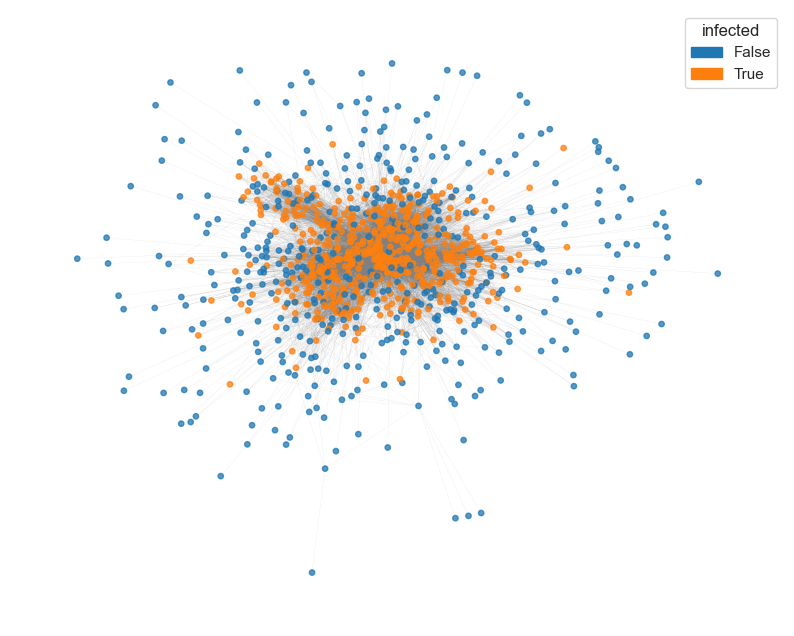

Percentage of infected nodes 53.4%


In [14]:
generic_show_static(G_infected, node_color='infected', node_size=15, k_core=0, width=10, height=8)
infected_count = sum(1 for node, data in G_infected.nodes(data=True) if data.get('infected') is True)
infected_percentage = infected_count / G_infected.number_of_nodes() * 100
print(f"Percentage of infected nodes {infected_percentage:.1f}%")

### Infection and assortativity

We can see that even though the model is IC and not Threshold base, there is still a sort of correlation between infection rate and
assortativity. We can see that departments that were greatly infected, also have low homophily, and viceversa, highly assortative departments
tend to have lower percentages for infections.

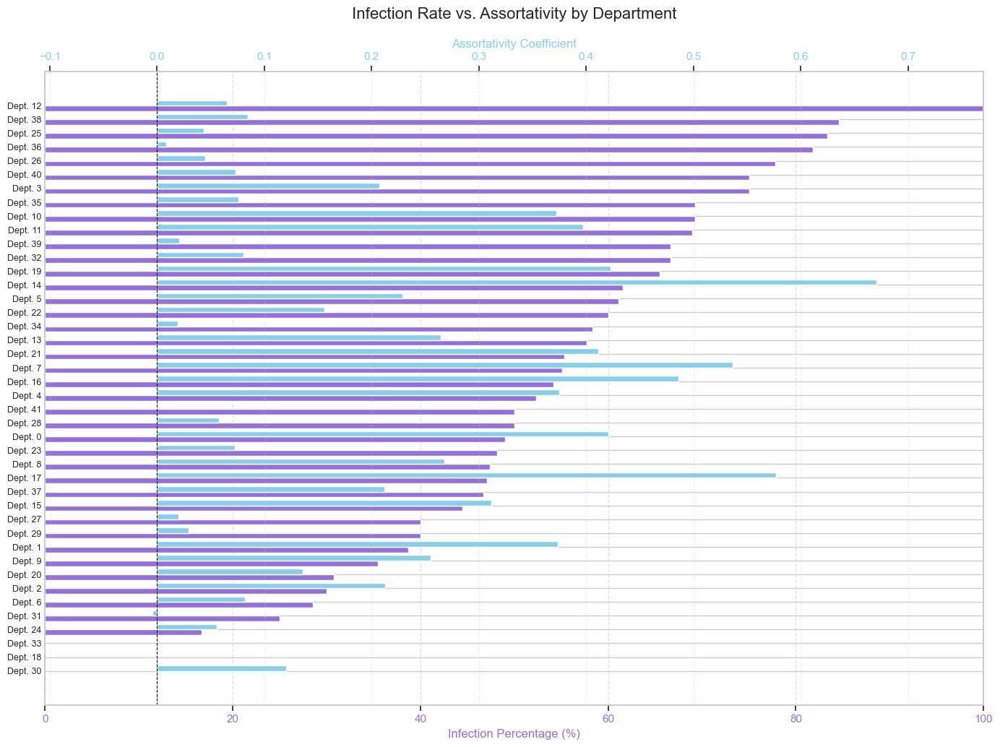

In [15]:
visualize_infection_and_assortativity(G_infected)

# Community Detection Algorithms

We apply three distinct algorithms to detect community structures within the network. These methods rely on different mathematical definitions of what constitutes a "community".

### Louvain Algorithm: 
The Louvain method is a heuristic algorithm based on Modularity Optimization. It is a greedy, iterative method that works in two phases:
1. Local Moving: Nodes are moved to neighbor communities if the move increases the graph's modularity ($Q$)
2. Aggregation: The graph is rebuilt where communities become single "super-nodes," and edge weights are summed. This process repeats until modularity no longer increases.

<cite>
Blondel, V. D., Guillaume, J. L., Lambiotte, R., & Lefebvre, E. (2008). Fast unfolding of communities in large networks. Journal of statistical mechanics: theory and experiment, 2008(10), P10008.
</cite>

Documentation for the implementations used in this notebook: [NetworkX Louvain](https://networkx.org/documentation/stable/reference/algorithms/generated/networkx.algorithms.community.louvain.louvain_communities.html)

### Leiden Algorithm
The Leiden algorithm is an improvement upon Louvain. It addresses the issue of disconnected communities and generally yields partitions with higher quality. It introduces a refinement phase between the moving and aggregation steps:
1. Local Moving: Similar to Louvain (fast modularity optimization).
2. Refinement: Communities are locally split to ensure they are well-connected.
3. Aggregation: The network is aggregated based on the refined partition.

<cite>
Traag, V. A., Waltman, L., & Van Eck, N. J. (2019). From Louvain to Leiden: guaranteeing well-connected communities. Scientific reports, 9(1), 1-12.
</cite>

Documentation for the implementations used in this notebook: [leidenalg](https://leidenalg.readthedocs.io/en/stable/reference.html)

### Spectral Clustering
Spectral Clustering uses the eigenvalues (spectrum) of the graph's Laplacian matrix to perform dimensionality reduction before clustering.
1. Construct the Laplacian matrix from the graph's adjacency matrix.
2. Compute the first $k$ eigenvectors to embed the nodes into a lower-dimensional space.
3. Apply a standard clustering algorithm (like K-Means) on these vectors to separate the nodes. Unlike Louvain/Leiden which optimize density, Spectral Clustering approximates the Min-Cut problem (minimizing the number of edges cut to separate the graph).

Documentation for the implementations used in this notebook: [sklearn SpectralClustering](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.SpectralClustering.html)

<cite>
Ng, A., Jordan, M., & Weiss, Y. (2001). On spectral clustering: Analysis and an algorithm. Advances in neural information processing systems, 14.
</cite>

In [16]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.cluster import SpectralClustering
from collections import defaultdict
import time
import warnings
warnings.filterwarnings('ignore')

from utils import (
    load_email, run_leiden,
    metric_avg_conductance, metric_internal_density, metric_coverage, metric_ari,
    visualize_static_entire_graph, visualize_communities, optimize_community_detection,
    get_best_granular_model
)

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [17]:
G = load_email(directed=False)
gt = nx.get_node_attributes(G, 'ground_truth')

print(f"Nodes: {G.number_of_nodes()}")
print(f"Edges: {G.number_of_edges()}")
print(f"Is Directed: {G.is_directed()}")

Nodes: 986
Edges: 16064
Is Directed: False


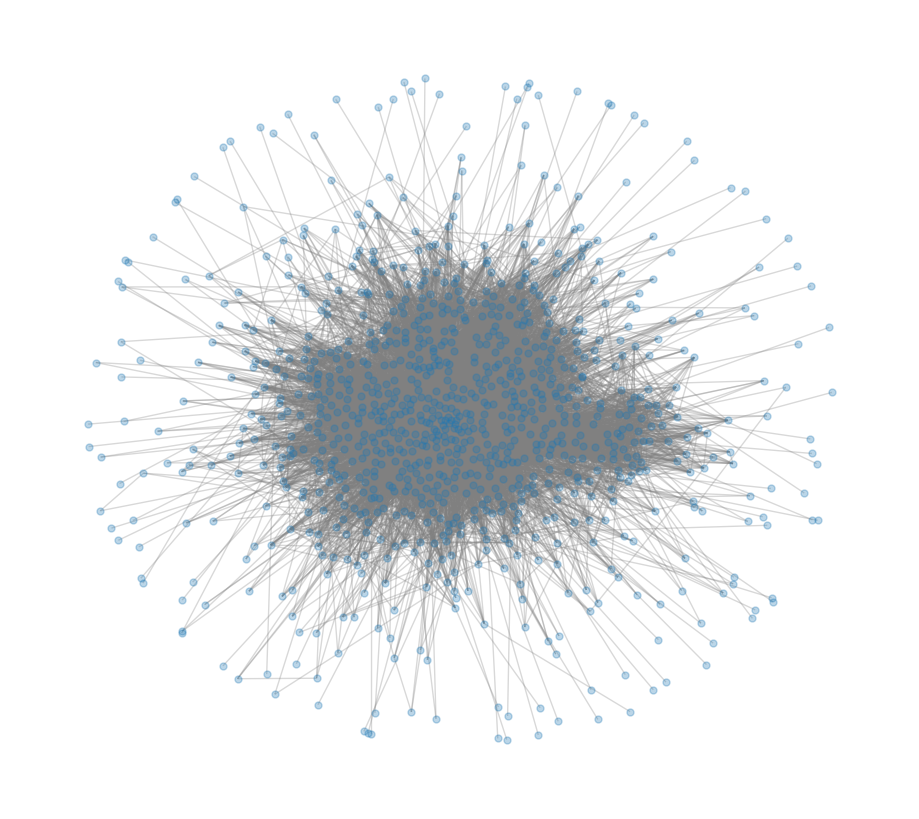

In [18]:
visualize_static_entire_graph(G, node_size= 25)

# Measures of Community Quality

To evaluate the quality of the detected communities, we utilize a combination of unsupervised metrics (structural quality) and supervised metrics (comparison to ground truth).

### Average Internal Density

This metric measures how "clique-like" the communities are. It calculates the density for each detected community and returns the average. The density of a subgraph is the ratio of actual edges to the number of possible edges.

For a community with $n$ nodes and $m$ edges: $Density = \frac{2m}{n(n-1)}$

Interpretation:
- High Value ($\to 1.0$): Nodes within the community are tightly interconnected. A value of 1.0 indicates a "Complete Graph" (everyone is connected to everyone).
- Low Value ($\to 0.0$): The community is sparse and loosely connected.

### Coverage

Coverage measures the fraction of the graph's total edges that fall within the communities, rather than cutting across them. It quantifies how "self-contained" the partition is.

We sum the number of edges inside all communities ($E_{in}$) and divide by the total edges in the entire graph ($E_{total}$): $Coverage = \frac{E_{in}}{E_{total}}$

Interpretation:
- High Value ($\to 1.0$): The partition successfully captures most edges within communities; few edges between groups.
- Low Value ($\to 0.0$): Many edges connect different communities, which hint at a weak community structure.

### Average Conductance

Conductance measures the "separability" or "isolation" of a community. It measures the ratio of edges that point outside the community versus the total connectivity (volume) of the community.

For a given set of nodes $S$, conductance is the fraction of total edge volume that leaves $S$. We calculate this for every community and take the average:

$\phi(S) = \frac{\text{Cut}(S)}{\min(\text{Vol}(S), \text{Vol}(\bar{S}))}$
- Cut(S): Number of edges leaving the community.
- Vol(S): Sum of degrees of nodes inside the community.

Interpretation:
- Low Value ($\to 0.0$): Good. The community is a distinct "island" with very few connections to the rest of the network.
- High Value ($\to 1.0$): Bad. The community is "leaky" and blends quite a bit into the rest of the graph.

### Adjusted Rand Index (ARI)

**Note: Ground Truth only exists for this dataset, and it is not present in the Twitch dataset.**

The ARI is a similarity measure between two data clusterings. Unlike standard accuracy, ARI is designed specifically for clustering tasks where the specific label values (e.g., "Group 0" vs. "Group 1") do not matter, only the grouping structure does.

- Permutation Invariance: In clustering, the algorithm might label a department as "Community 5" while the ground truth labels it "Department A." Standard accuracy would mark this as an error. ARI ignores the specific labels and asks: "If node A and node B are in the same group in the Ground Truth, are they also in the same group in the Prediction?"

- Adjustment for Chance: The raw Rand Index (RI) simply counts the fraction of correct pair agreements. However, the RI means that random assignments have a score greater than zero, which makes comparison difficult. The Adjusted RI corrects this by subtracting the expected score of a random partition.

$$ARI = \frac{RI - \text{Expected\_RI}}{\max(RI) - \text{Expected\_RI}}$$

- We use the [sklearn adjusted_rand_score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.adjusted_rand_score.html) implementation.

Interpretation:
- $1.0$: Perfect match (The partitions are identical up to a permutation of labels).
- $0.0$: The result is exactly what you would expect from random chance.
- $< 0.0$: The result is worse than random.

## Experimental Setup

To objectively compare community detection algorithms, we implemented a parameter grid search that optimizes for structural integrity rather than the algorithm's own objective function (e.g., Modularity). This prevents circular reasoning where an algorithm is "best" simply because it maximizes the metric it was designed to optimize.

### Composite Structural Score

We define a custom Composite Score to rank partitions. This score balances separation (how isolated communities are) with cohesion (how connected members are).

$\text{Composite Score} = 0.4 \times (1 - \text{Conductance}) + 0.3 \times \text{Density} + 0.3 \times \text{Coverage}$

The metrics are as follows
1. Avg Conductance (Lower is better): Measures the "leakiness" of communities (fraction of edges leaving the set). We invert this ($1 - C$) so that higher values contribute positively.
2. Avg Internal Density (Higher is better): Measures how tightly connected the nodes are within a community.
3. Coverage (Higher is better): The fraction of total graph edges that exist within the detected communities.

### Grid Search

We iterate through a range of hyperparameters for each algorithm:
- Louvain & Leiden: Resolution Parameter ($0.2$ to $5.0$).
- Spectral Clustering: Number of Clusters $k$ ($5$ to $65$).

Selection vs. Validation:
- Selection: The "Best" model is selected purely based on the unsupervised Composite Score.
- Validation: We calculate the Adjusted Rand Index (ARI) against the Ground Truth (Departments) for the selected model.

In [19]:
# Hyperparameters
resolutions = np.linspace(0.2, 5.0, 20)
k_values = range(5, 65, 5)

# Optimization
df_leiden = optimize_community_detection(G, "leiden", resolutions, gt)
df_louvain = optimize_community_detection(G, "louvain", resolutions, gt)
df_spectral = optimize_community_detection(G, "spectral", k_values, gt)

--- Optimizing leiden ---
leiden finished in 2.28 seconds.
--- Optimizing louvain ---
louvain finished in 1.93 seconds.
--- Optimizing spectral ---
spectral finished in 0.98 seconds.


### Hyperparameter Ranges

- Left Panel (Resolution Optimization):
    - Compares Leiden (Green) and Louvain (Blue) across resolution parameters ranging from $0.2$ to $5.0$.
    - The peak of the curve represents the "structural sweet spot" where the community definitions are most mathematically robust.
    - A sharp drop-off typically indicates over-fragmentation (shattering communities) or under-segmentation (giant blobs).

- Right Panel (Cluster Count Optimization):
    - Evaluates Spectral Clustering by forcing the algorithm to find $k$ partitions ($5$ to $65$).
    - The Red Dotted Line at $k=42$ represents the Ground Truth (the actual number of departments).
    - Interpretation: Ideally, the peak of the composite score (Purple square) should align with the red line. **This shows a conflict between the graph's topology (math) and its labels (reality).**

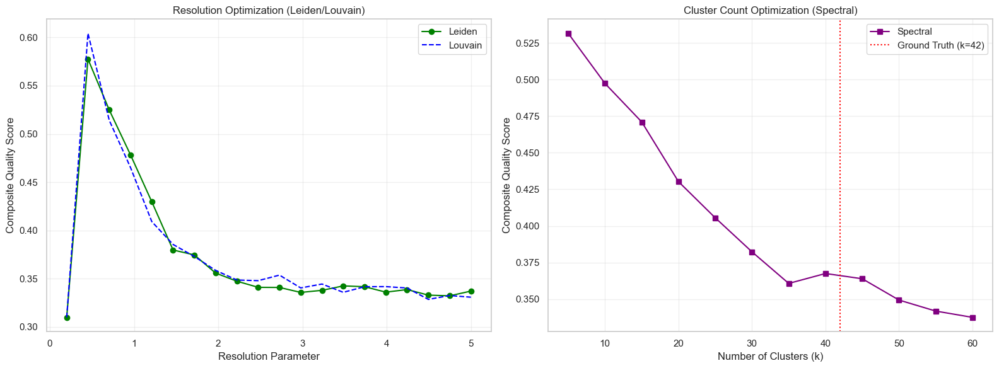

In [20]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Resolution Optimization
ax1.plot(df_leiden['Param'], df_leiden['Composite_Score'], label='Leiden', color='green', marker='o')
ax1.plot(df_louvain['Param'], df_louvain['Composite_Score'], label='Louvain', color='blue', linestyle='--')
ax1.set_title("Resolution Optimization (Leiden/Louvain)")
ax1.set_xlabel("Resolution Parameter")
ax1.set_ylabel("Composite Quality Score")
ax1.legend()
ax1.grid(True, alpha=0.3)

# Plot 2: K Optimization
ax2.plot(df_spectral['Param'], df_spectral['Composite_Score'], label='Spectral', color='purple', marker='s')
ax2.axvline(x=42, color='red', linestyle=':', label='Ground Truth (k=42)')
ax2.set_title("Cluster Count Optimization (Spectral)")
ax2.set_xlabel("Number of Clusters (k)")
ax2.set_ylabel("Composite Quality Score")
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

### Min 5 Communities

To avoid trivial partitions (e.g., 2 giant communities), we filter out results with fewer than 5 detected communities when selecting the best model.

Mathematically, the algorithms maximize structural quality (Composite Score $\approx 0.53$) by partitioning the graph into 6 large communities. While these partitions are structurally robust (low Conductance), the low ARI ($\approx 0.20$) indicates they represent larger organizational divisions rather than specific departments.

In [21]:
best_leiden = get_best_granular_model(df_leiden, min_communities=5)
best_louvain = get_best_granular_model(df_louvain, min_communities=5)
best_spectral = get_best_granular_model(df_spectral, min_communities=5)

# combine
summary_df = pd.DataFrame([best_leiden, best_louvain, best_spectral])
summary_df.set_index("Algorithm", inplace=True)

display_cols = ["Param", "Communities", "Composite_Score", "ARI", "Conductance", "Density", "Coverage"]
final_view = summary_df[display_cols]

styled_table = final_view.style.background_gradient(
    cmap='Greens', subset=["Composite_Score", "ARI", "Density", "Coverage"]
).background_gradient(
    cmap='Greens_r', subset=["Conductance"] # Low is good
).format("{:.4f}")

print("\nBest Granular Configurations (min 5 communities)")
display(styled_table)


Best Granular Configurations (min 5 communities)


,Param,Communities,Composite_Score,ARI,Conductance,Density,Coverage
Algorithm,,,,,,,
Leiden,0.7053,6.0000,0.5249,0.2068,0.3426,0.2057,0.6673
Louvain,0.7053,6.0000,0.5142,0.2004,0.3456,0.1738,0.6675
Spectral,5.0000,5.0000,0.5315,0.0990,0.3533,0.1394,0.7700


Detected 6 communities using Leiden with resolution 0.7053.

=== COMMUNITY STATISTICS (EMAIL) ===
community       | num_nodes      
---------------------------------
0               | 361            
1               | 243            
2               | 144            
3               | 113            
4               | 93             
5               | 32             


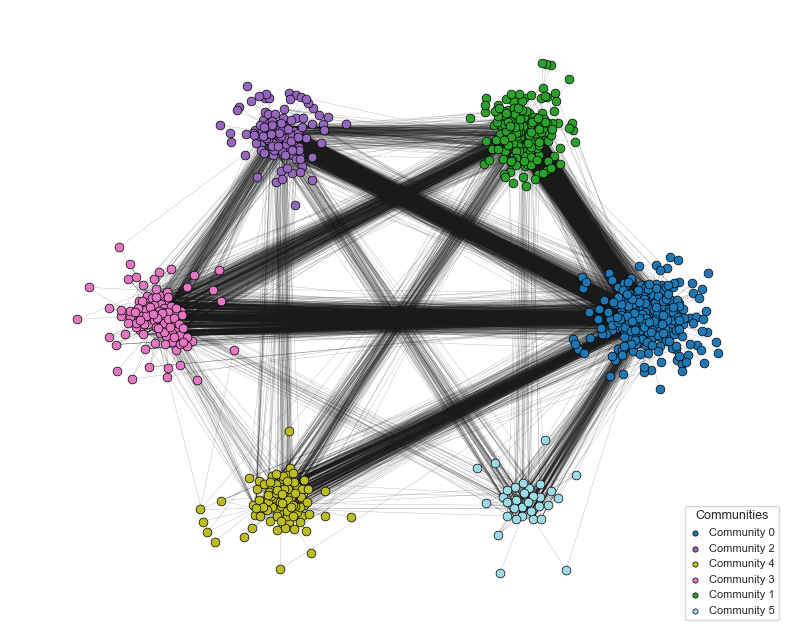

In [22]:
visualize_communities(G, method="leiden", resolution=0.7053, dataset_name="email")

#### **Insights of Leiden Communities**

**The case of 6 Super-Communities (above)**

Mathematically, the algorithms prefer this coarse-grained partition. The Composite Scores here ($\approx 0.52$) are significantly higher than in the granular configuration ($\approx 0.35$). This indicates that the network's strongest structural boundaries form 6 large "Super-Communities" (likely Divisions or Directorates) rather than 42 small departments.Both Leiden and Louvain converged on Resolution $0.7053$, finding 6 communities. While structurally stable (Conductance $\approx 0.34$), the low ARI ($\approx 0.20$) confirms that these super-groups are too broad to represent specific departments.

**The case of 51 Communities (below)**

Leiden proved to be the most accurate algorithm for this specific dataset, achieving the highest ARI (0.62) and finding 51 communities. This slight over-segmentation (51 vs 42) suggests that Leiden not only found the departments but potentially identified distinct sub-teams within larger departments.

Leiden's superiority over Louvain here is likely due to its Refinement Phase. While Louvain merged collaborating departments, Leiden successfully recognized them as separate dense structures and split them. It essentially prioritized "clique strictness" over general connectivity. This makes more sense for organizational structures, where distinct teams exist even if they collaborate a lot.

**Metrics Leiden**
The metrics for Leiden are very similar to Louvain but slightly more extreme in the "Micro" direction.
- Density (0.486): Higher than Louvain. Leiden found tighter internal structures.
- Conductance (0.79): Slightly higher (more leaky) than Louvain.
- Interpretation: The fact that Leiden has higher density and higher conductance confirms that it went deeper into the graph's structure. It found the absolute core of each department. It accepted a messier boundary (higher conductance) to make sure that the internal structure of the community was mathematically perfect (higher density). This is why it achieved the highest match with the Ground Truth out of the three algorithms.

Detected 6 communities using Louvain with resolution 0.7053.

=== COMMUNITY STATISTICS (EMAIL) ===
community       | num_nodes      
---------------------------------
0               | 237            
1               | 92             
2               | 111            
3               | 51             
4               | 377            
5               | 118            


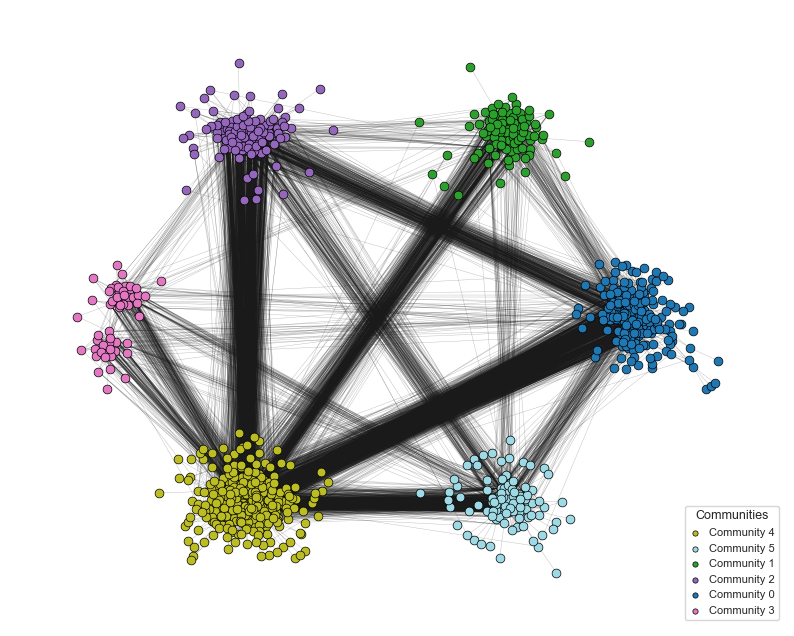

In [23]:
visualize_communities(G, method="louvain", resolution=0.7053, dataset_name="email")

#### **Insights of Louvain Communities**

**The case of 45 Communities (below)**

Louvain successfully transitioned from finding divisions to finding departments when the resolution was increased ($3.23$, see the parameters below).

The high ARI (0.60) confirms that Louvain correctly identified that departments are formed by internal density (cliques of colleagues emailing each other). However, it found fewer communities than Leiden (45 vs 51). This is a known behavior of Louvain: it tends to merge distinct but interacting communities into larger groups. In the context of this email network, Louvain likely merged two closely collaborating departments into a single community because the volume of emails between them was high enough to trick the algorithm.

**Metrics Louvain**

At the granular level **(Min 40)**, the metrics tell a clear story of "High Density, High Leakage."

- Density (0.47): This is high. It proves that inside the communities Louvain found, connectivity is very strong.
- Conductance (0.78): This is technically "bad" (high leakage), but in this context, it is necessary. It reflects the reality that employees constantly email people outside their department.
- Trade-off: To achieve the high ARI (finding the departments), Louvain had to sacrifice separation (Conductance). This confirms that the "natural" mathematical state of the graph is closer to 6 big blobs as you can see above, and finding the departments required forcing the algorithm against the natural gradient of the graph.


=== COMMUNITY STATISTICS (EMAIL) ===
community       | num_nodes      
---------------------------------
0               | 66             
1               | 38             
2               | 25             
3               | 53             
4               | 804            


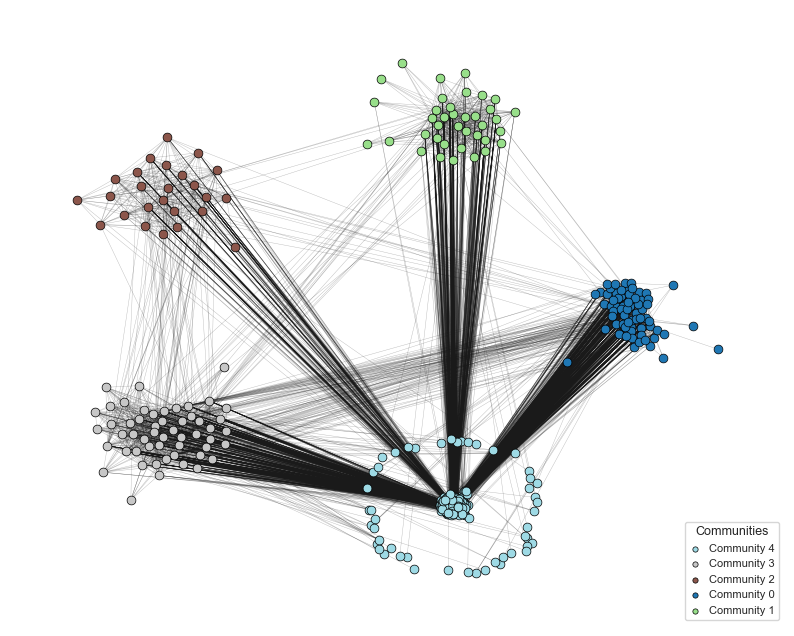

In [24]:
visualize_communities(G, method="spectral", k=5, dataset_name="email", n_neighbors=20)

#### **Insights Spectral**

**The case of 5 Clusters (above)**

Spectral Clustering has a strong preference for the Macro-Structure over the Ground Truth. At $k=5$, it achieved the highest Composite Score (0.53) but the lowest ARI (0.09). This means that Spectral identified mathematically sharp "cuts" in the network (likely separating the largest organizational divisions), but these cuts had almost no correlation with actual departments.

**The case of 40 clusters (below)**

Even when forced to find 40 clusters (matching the approximate number of departments, you can see that below), Spectral underperformed compared to density-based methods (ARI 0.43 vs 0.62). This suggests that departments in this organization are not defined by "bottlenecks" (which Spectral looks for). There is likely too much inter-departmental communication for a Min-Cut approach to work properly; instead of identifying actual departments, Spectral likely prioritized separating small, outlying groups, forcing it to make random cuts through the dense center of the network.

### Min 40 Communities

By forcing a finer granularity, the Composite Score drops ($\approx 0.34$), meaning that the specific departments are more interconnected ("leakier") than the divisions. However, the ARI increases by a lot ($\approx 0.62$), confirming that the Ground Truth ($k=42$) exists at this lower scale (which is less optimal structurally).

In [25]:
best_leiden = get_best_granular_model(df_leiden, min_communities=40)
best_louvain = get_best_granular_model(df_louvain, min_communities=40)
best_spectral = get_best_granular_model(df_spectral, min_communities=40)

# combine
summary_df = pd.DataFrame([best_leiden, best_louvain, best_spectral])
summary_df.set_index("Algorithm", inplace=True)

display_cols = ["Param", "Communities", "Composite_Score", "ARI", "Conductance", "Density", "Coverage"]
final_view = summary_df[display_cols]

styled_table = final_view.style.background_gradient(
    cmap='Greens', subset=["Composite_Score", "ARI", "Density", "Coverage"]
).background_gradient(
    cmap='Greens_r', subset=["Conductance"] # Low is good
).format("{:.4f}")

print("\nBest Granular Configurations (min 40 communities)")
display(styled_table)


Best Granular Configurations (min 40 communities)


,Param,Communities,Composite_Score,ARI,Conductance,Density,Coverage
Algorithm,,,,,,,
Leiden,3.4842,51.0000,0.3425,0.6232,0.7928,0.4859,0.3795
Louvain,3.2316,45.0000,0.3445,0.6082,0.7844,0.4699,0.3909
Spectral,40.0000,40.0000,0.3675,0.4403,0.6896,0.4050,0.4061


### Algorithm Performance

- Leiden outperformed all models at the micro-scale (ARI $0.62$ vs Spectral $0.43$). This means that the departmental structure is defined by internal density (cliques of colleagues), which Leiden optimizes better, rather than by min-cuts, which Spectral attempts to find.
- Spectral Limitation: Even when forced to find $k=40$ clusters, Spectral Clustering achieved a significantly lower ARI. This suggests that the "cuts" required to isolate departments are not geometrically distinct in the eigenvector space, likely due to high edge overlap bewteen departments.

# Twitch platform Social Network Analysis
This dataset represents a social network of Twitch users collected via the public Twitch API in Spring 2018. Twitch is a live-streaming platform where people broadcast and watch real-time content, especially video-game playthroughs, esports, and creative streams. It also features interactive chat, letting viewers engage directly with streamers and communities

Each node corresponds to an individual user (often a viewer, not necessarily a streamer) and edges denote ***mutual follower relationships***  between user pairs. The resulting graph constitutes a single connected component. We decided to focus on the portuguese speakers subset of the dataset.

The dataset can be found in [kaggle](https://www.kaggle.com/datasets/andreagarritano/twitch-social-networks?select=FR)

In [26]:
from utils import *

G = nx.read_edgelist("data/twitch/musae_PTBR_edges.csv", delimiter=",", nodetype=int, comments="f")
G, df = load_twitch_user_attributes(G)

We also know some extra attributes of the users:
        
- account_age_days: The age of the user’s account, measured in days since creation at the time the data was collected.
- is_mature: A boolean flag indicating whether the user’s channel is marked as containing mature or adult-oriented content.
- total_views: The total number of views the user’s Twitch channel has received.
- is_partner: Indicates whether the user is a Twitch Partner, a verified status given to established streamers with significant viewership 

Now we can visualize the graph to get a better understanding:

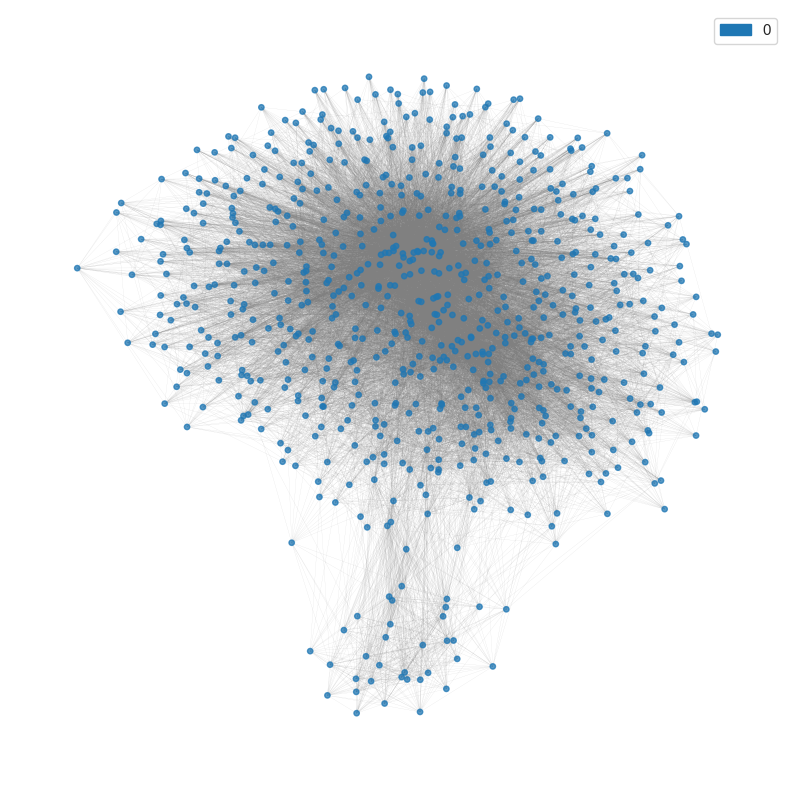

In [27]:
#visualize_static_entire_graph(G, node_size= 25)
generic_show_static(G, node_size=15, k_core=20)

Now we can do an interactive visualization that also shows the attributes for each node. Also we keep the nodes of k_core 10 to showcase the more important nodes:

In [28]:
#generic_show(G, node_color='blue', node_size=20, node_tooltip=["id", "account_age_days", "total_views", "is_partner", "is_mature"], k_core=10)


Next, the graph summary statistics:

In [29]:
summary_stats(G)

Number of nodes: 1912
Number of edges: 31299
Average degree: 32.74
Density: 0.0171
Average clustering coefficient: 0.3199
Graph is connected.
Radius: 4
Diameter: 7
Average shortest path length: 2.53


#### Insights
The Portuguese Twitch dataset shows a graph that is fairly large but also very well connected. Even though there are almost two thousand users, the network is fully connected, meaning everyone is reachable through others (no isolated component) which makes sense since gamers usually play and watch multiple games. On average, each user is connected to about 33 others, which helps explain why the average distance between any two people is only about 2-3 hops. The diameter of 7 and radius of 4 also suggest that no one is ever too far from anyone else. Even though the overall density is low, as is normal for social networks, the clustering coefficient is pretty high, meaning friends of a user are often friends with each other (holding the triadic closure). Overall, it looks like a close-knit community where information and interactions can spread quite fast.


### Attribute exploration
Next we can explore the attributes associated with each node to find some interesting insights:

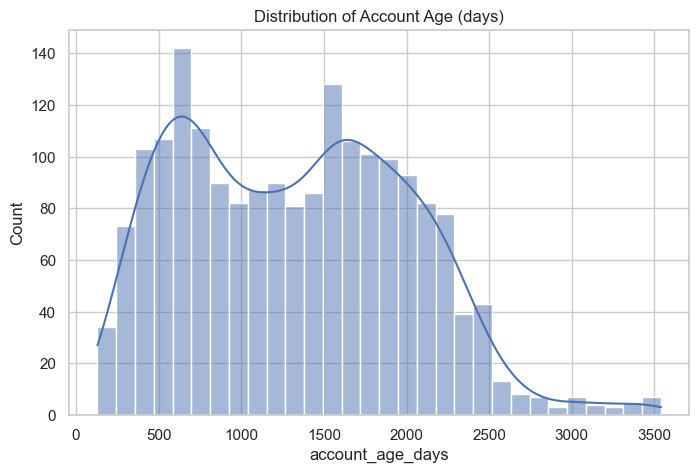

The distribution of account age shows a broad spread with two noticeable peaks around 600 and 1600 days, indicating both a large group of relatively new users and a substantial cluster of long-standing accounts, while very old accounts (3000+ days) are rare.

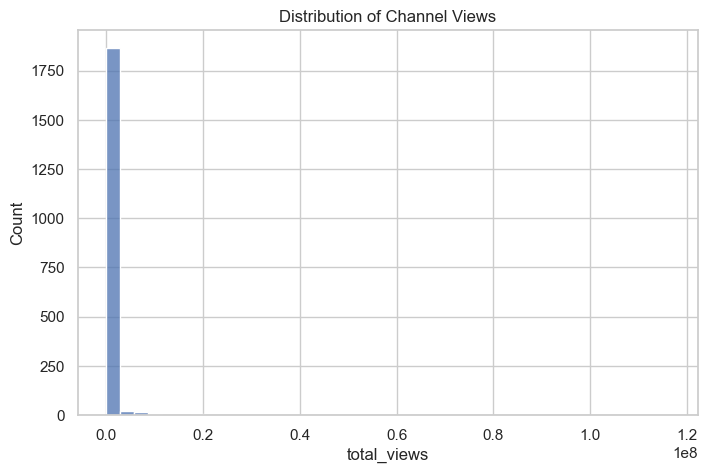

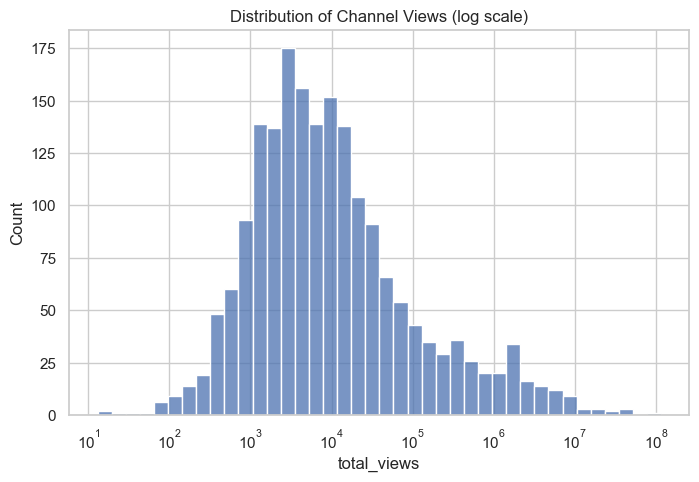

The distribution of channel views is heavily right-skewed, with most streamers clustered between 1,000 and100,000 views while a small number of outliers reach into the millions, highlighting a strong popularity imbalance on the platform.

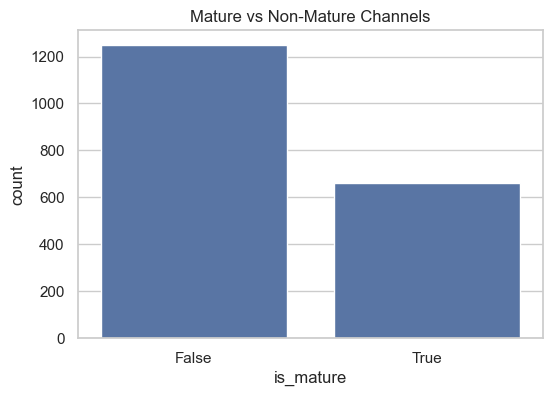

Percentage of mature indicated channels: 34.57%


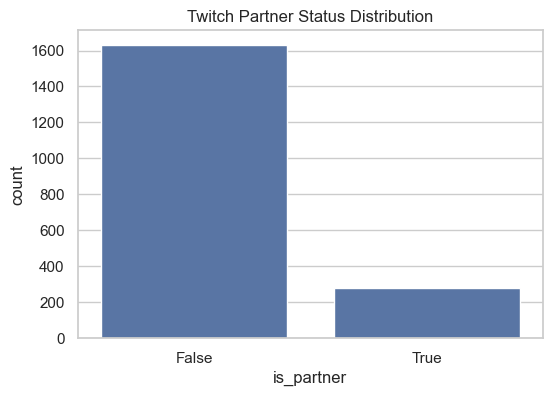

Percentage of Twitch Partners: 14.59%


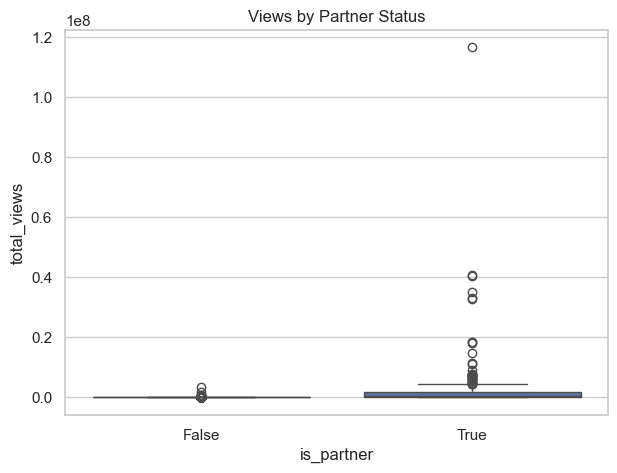

Partnered streamers have dramatically higher view counts than non-partners,with most of the extreme outliers concentrated in the partner group, highlighting astrong divide in visibility and reach between the groups.

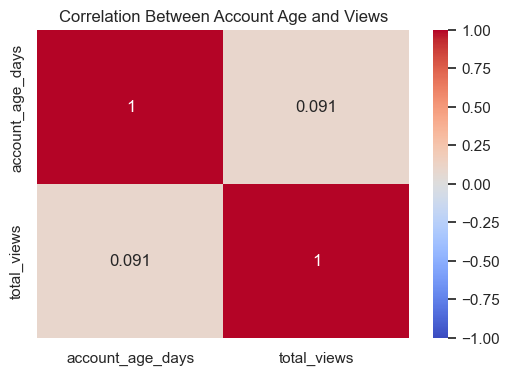

There is only a very weak positive correlation between account age and total views,suggesting that simply having an older Twitch account does not correspond to how many views achannel gets.

Summary statistics:
      account_age_days total_views
count             1912        1912
mean              1327      408715
std                685     3454463
min                129           0
25%                716        2015
50%               1316        6706
75%               1854       31372
max               3541   116392808 

Average views by partner status:
is_partner
False      19124
True     2689010
Name: total_views, dtype: object 

Average account age by mature flag:
is_mature
False    1338
True     1308
Name: account_age_days, dtype: object 

Top 10 most viewed accounts:
        id total_views account_age_days is_partner is_mature
1488   290   116392808             1896          1         0
945   1320    40659090             2490          1         0
601    103    40456102             2454          1         0
315   1739    35175114             1781          1         0
1443  1660    33101623             2024          1         0
1410   127    32672093             1592  

In [30]:
twitch_user_exploratory_analysis(df)

Also, the degree distribution and clique size distribution:

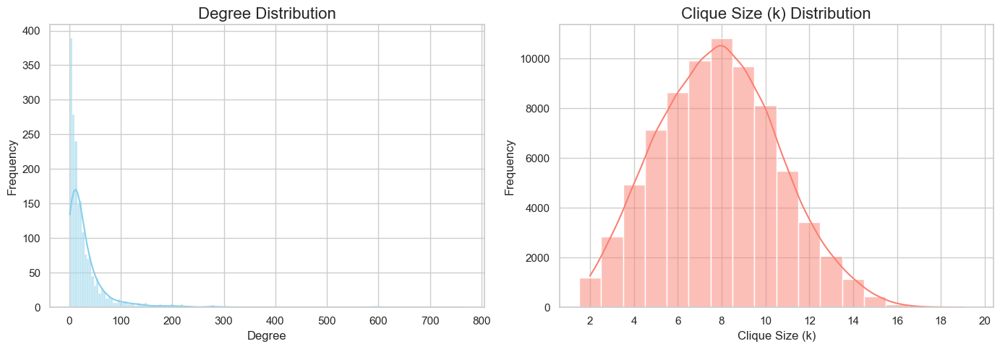

In [31]:
hist_degrees_cliques_computed(G)

The degree distribution is extremely right-skewed, showing that while most Twitch users have only a small number of mutual follower connections, a small set of highly connected nodes reach degrees above 500–700.

The clique size distribution peaks around 7–9 members, suggesting that Twitch users commonly form moderately sized, tightly connected groups, while very large cliques are rare, showing the presence of strong local communities but limited extremely dense subgraphs.The size of the clique makes sense since in most video games not more than 10 players can play at the same time.

### Centralities Analysis
#### Degree Centrality


Top 10 nodes by degree centrality:

 node   degree  raw_degree   id  account_age_days  is_mature  total_views  is_partner
  127 0.401361         767  127              1592      False     32672093        True
 1476 0.312925         598 1476              2195      False     18475754        True
  290 0.308739         590  290              1896      False    116392808        True
 1297 0.307169         587 1297              2215      False      7724802        True
  467 0.304553         582  467              1774      False     11392773        True
 1660 0.248561         475 1660              2024      False     33101623        True
   67 0.237572         454   67              1660       True      6905465        True
 1320 0.217687         416 1320              2490      False     40659090        True
 1758 0.206175         394 1758              1359      False      4397521        True
 1259 0.201465         385 1259              2153      False     17962557        True



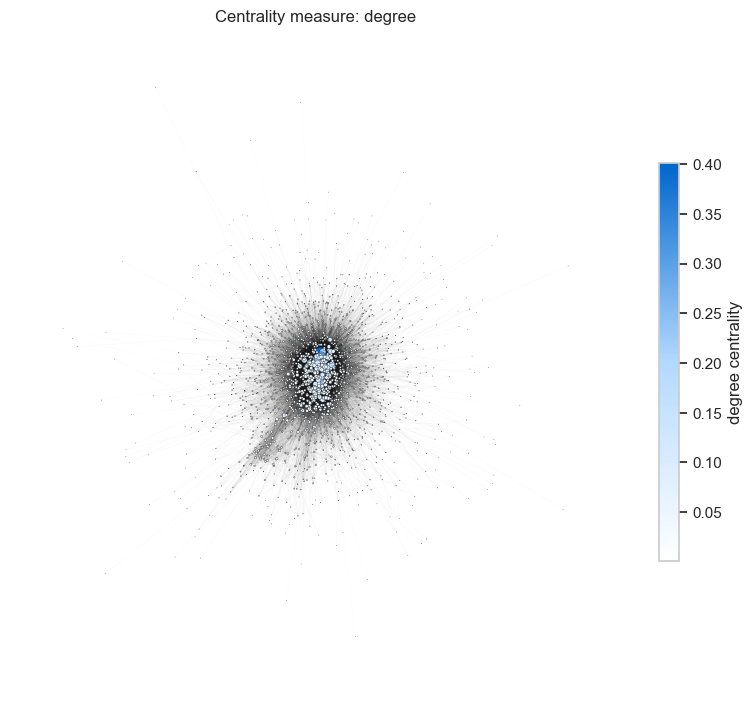

In [32]:
visualize_centrality(G=G, measure='degree')

The nodes with the highest degree centrality, which are found in the center of the graph, act as major players in the Twitch social media graph, connecting to a large portion of all other users and therefore playing a crucial role in holding the network together. These nodes are all <b> Twitch Partners </b> with extremely high view counts and long account histories, showing that visibility, popularity, and longevity strongly contribute to their central position in the network. Their high raw degrees, ranging from around 385 to 767 neighbors, indicate that they maintain an unusually large number of direct connections, giving them strong influence to the network especially when considering that the average degree is only around 32 neighbors. Interestingly, almost all of these highly connected nodes are non-mature channels, implying that potentially a lot of younger audiences are watching and supporting them.

#### Closeness Centrality


Top 10 nodes by closeness centrality:

 node  closeness   id  account_age_days  is_mature  total_views  is_partner
  127   0.600943  127              1592      False     32672093        True
 1297   0.568412 1297              2215      False      7724802        True
  467   0.565050  467              1774      False     11392773        True
  290   0.559590  290              1896      False    116392808        True
 1476   0.559426 1476              2195      False     18475754        True
   67   0.543515   67              1660       True      6905465        True
 1660   0.541667 1660              2024      False     33101623        True
 1593   0.529510 1593              1555      False      3094236        True
 1259   0.523705 1259              2153      False     17962557        True
  287   0.522702  287              2238       True      7443937        True



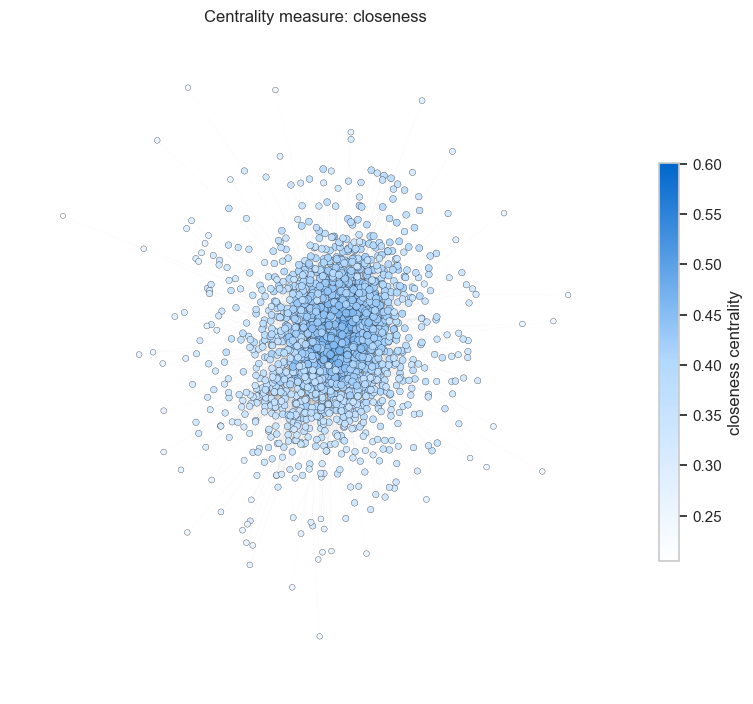

In [33]:
visualize_centrality(G=G, measure='closeness')

The nodes with the highest closeness centrality sit at the core of the Twitch social network in terms of distance: on average, they are only a few steps away from all other users, meaning they can reach the rest of the network very efficiently along short paths. All of these top-10 nodes are Twitch Partners, and they tend to have both high total views and relatively old accounts, which suggests that well-established, popular streamers are not only highly connected but also geographically central in the graph’s structure. Several nodes (like 127, 1297, 467, 290, 1476, 1660, 1259) appear among the top for both degree and closeness, reinforcing the idea that these are key players that are both well connected and well positioned to quickly interact with or influence many others. Again the majority of nodes are non-mature channels.

#### Eigenvector


Top 10 nodes by eigenvector centrality:

 node  eigenvector   id  account_age_days  is_mature  total_views  is_partner
  127     0.178778  127              1592      False     32672093        True
 1297     0.158668 1297              2215      False      7724802        True
  467     0.157239  467              1774      False     11392773        True
  290     0.151502  290              1896      False    116392808        True
 1476     0.145761 1476              2195      False     18475754        True
 1660     0.133757 1660              2024      False     33101623        True
   67     0.131181   67              1660       True      6905465        True
 1593     0.125898 1593              1555      False      3094236        True
 1320     0.118587 1320              2490      False     40659090        True
 1758     0.115409 1758              1359      False      4397521        True



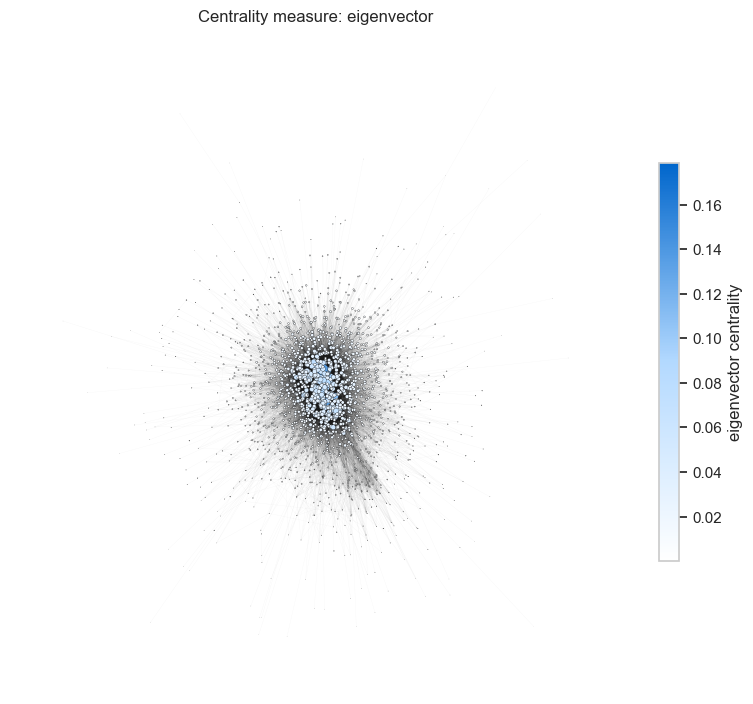

In [34]:
visualize_centrality(G=G, measure='eigenvector')

The nodes with the highest eigenvector centrality form a tightly connected core of highly influential streamers whose importance comes not just from how many neighbors they have, but from being connected to other important nodes. This top-10 list almost perfectly overlaps with the top nodes from degree and closeness centrality, meaning these users are not only well-connected and centrally located but also embedded in a cluster of other high-status users, which increases their influence in the network according to eigenvector theory. All of these nodes are Twitch Partners with large view counts and long account ages, showing that established, popular channels tend to reinforce each other's influence by collaborating and making group contect many times. Nodes like 127, 1297, 467, 290, and 1476 all lie in a rich, mutually reinforcing subgraph of prominent streamers. Together, these users form an elite cluster whose connections make them structurally powerful and highly influential across the graph.

#### Betweeness Centrality


Top 10 nodes by betweenness centrality:

 node  betweenness   id  account_age_days  is_mature  total_views  is_partner
  127     0.099261  127              1592      False     32672093        True
 1476     0.054895 1476              2195      False     18475754        True
 1297     0.050421 1297              2215      False      7724802        True
  290     0.050112  290              1896      False    116392808        True
  467     0.043825  467              1774      False     11392773        True
   67     0.034426   67              1660       True      6905465        True
 1660     0.026247 1660              2024      False     33101623        True
 1259     0.023295 1259              2153      False     17962557        True
  287     0.022121  287              2238       True      7443937        True
  428     0.021980  428               845       True       552640        True



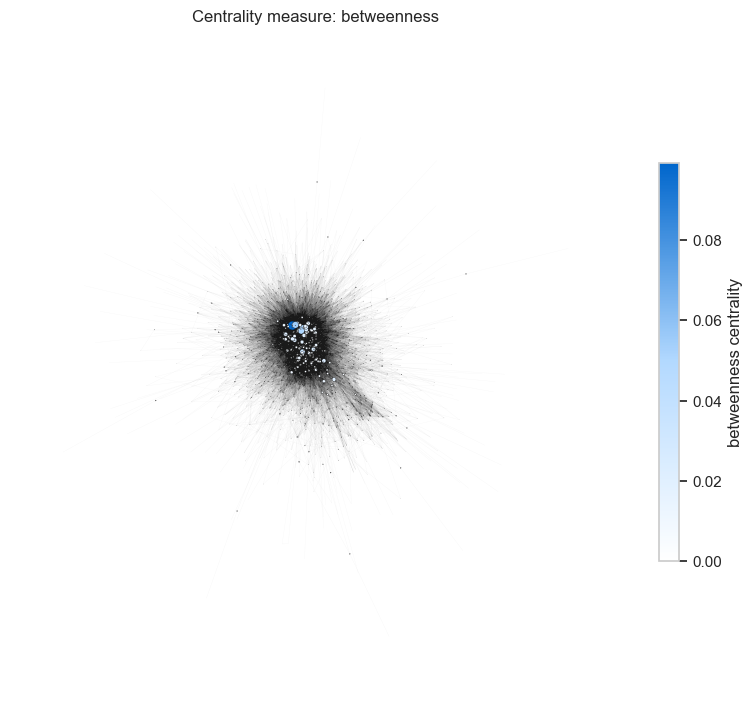

In [35]:
visualize_centrality(G=G, measure='betweenness')

The nodes with the highest betweenness centrality function as key bridges in the Twitch social network, sitting on a large number of the shortest paths that connect different parts of the graph. These users act as intermediaries of the information flow between communities and thus information is more likely to pass through them, giving them a form of information spread power. Similar to the other centrality measures, the top betweenness nodes are all Twitch Partners with significant view counts and generally older accounts. Nodes like 127, 1476, 1297, and 290 consistently appear across all centrality rankings, reinforcing their role as major players in the network. A notable difference is the extra presence of a few mature-content channels (67, 287, 428), suggesting that while mature channels may not be the most popular, some still serve as important bridges between content clusters.


#### Centrality - User Attribute correlation

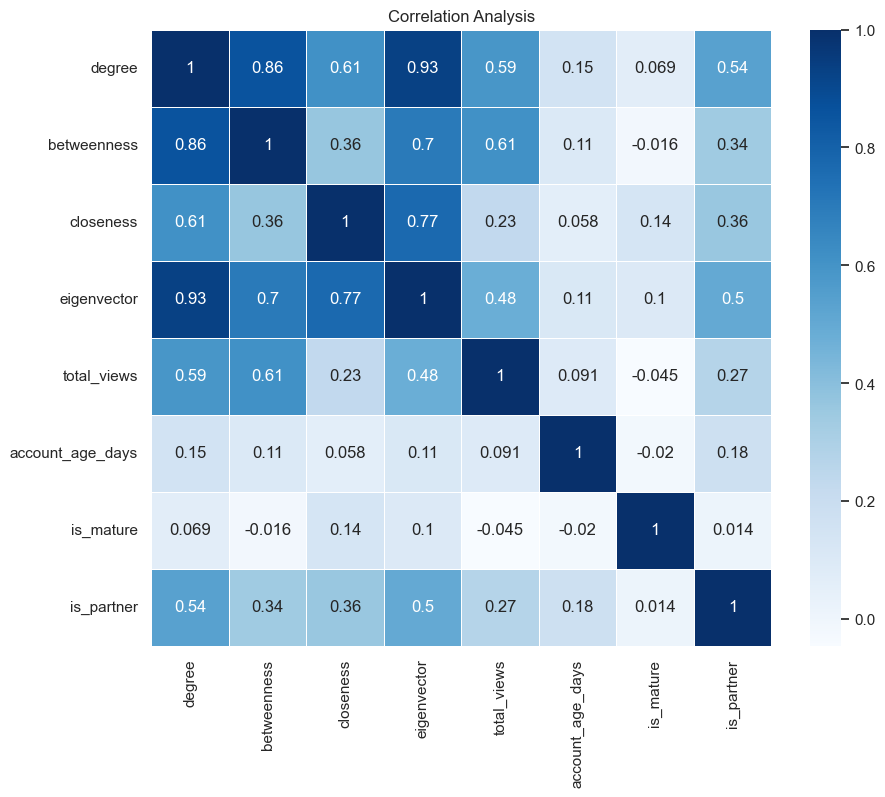

In [36]:
compare_centralities_with_attributes(G)

- Degree, eigenvector, and betweenness centrality are strongly correlated (0.86–0.93), indicating that the most connected users also tend to be the most influential within the network’s core and serve as important bridges of the information flow.

- Closeness centrality is moderately correlated with degree and eigenvector centrality (0.61–0.77), suggesting that nodes with many connections or influential neighbors also tend to be situated relatively close, in terms of path distance, to the rest of the network.

- Total views show moderate correlation with degree and betweenness (0.59–0.61), meaning popular streamers tend to be highly connected and sit on key pathways, but high popularity does not automatically guarantee a highly central structural position.

- Eigenvector centrality is the strongest single correlate of degree (0.93), reflecting how central players cluster together in the Twitch graph.

- Account age shows very weak correlation (0.05–0.15) with all centrality measures and with total views, implying that simply having an older account does not strongly determine structural importance or popularity.

- Partner status shows a moderate positive correlation degree and eigenvector centrality indicating that Twitch Partners tend to occupy more connected, influential positions in the network than non-partners.

### Community Detection
Similar to the community detection in the emails graph, we use the custom Composite Score to rank partitions:

$\text{Composite Score} = 0.4 \times (1 - \text{Conductance}) + 0.3 \times \text{Density} + 0.3 \times \text{Coverage}$

Again, we use the grid search approach to iterate through a range of hyperparameters for each algorithm:
- Louvain & Leiden: Resolution Parameter ($0.2$ to $5.0$).
- Spectral Clustering: Number of Clusters $k$ ($3$ to $65$).

- Selection: The "Best" model is selected purely based on the unsupervised Composite Score.


In [37]:
# Resolution-based Algorithms (Louvain / Leiden)
resolutions = np.linspace(0.2, 5.0, 50)
df_leiden = optimize_community_detection(G, "leiden", resolutions, ground_truth=None)
df_louvain = optimize_community_detection(G, "louvain", resolutions, ground_truth=None)

# Count-based Algorithms (Spectral)
k_values = range(3, 65, 2) 
df_spectral = optimize_community_detection(G, "spectral", k_values, ground_truth=None)

--- Optimizing leiden ---
leiden finished in 20.76 seconds.
--- Optimizing louvain ---
louvain finished in 12.96 seconds.
--- Optimizing spectral ---
spectral finished in 8.84 seconds.


### Hyperparameter Ranges

- Left Panel (Resolution Optimization):
    - This plot compares how Leiden (green) and Louvain (blue) behave as we change the resolution parameter from 0.2 to 5.0.
    - The peak in each curve marks the point where the algorithm produces the most stable and meaningful community structure based on the custom metric.
    - When the score drops sharply, it usually means the resolution is too high or too low, causing either:
        - Too many tiny clusters (over-fragmentation), or
        - One oversized cluster (under-segmentation)


- Right Panel (Cluster Count Optimization):
    - This plot shows how the quality score changes when Spectral Clustering is forced to create k clusters, ranging from 4 to 65.
    - The highest part of the curve indicates where Spectral Clustering performs best before quality gradually decreases with larger k.


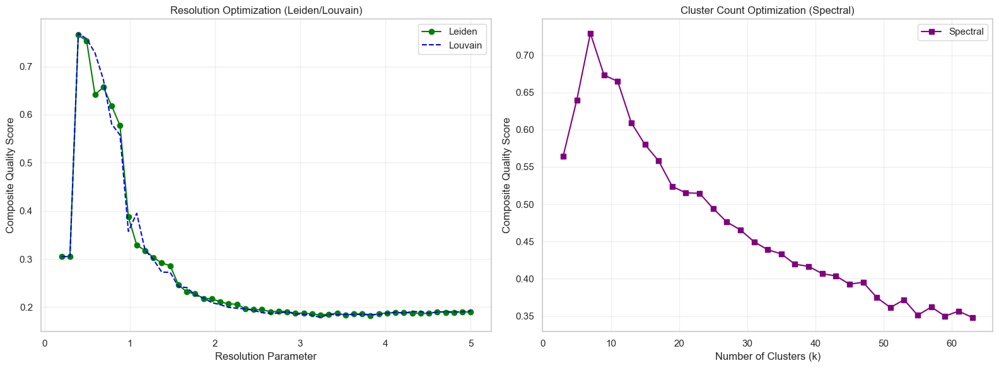

In [38]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

ax1.plot(df_leiden['Param'], df_leiden['Composite_Score'], label='Leiden', color='green', marker='o')
ax1.plot(df_louvain['Param'], df_louvain['Composite_Score'], label='Louvain', color='blue', linestyle='--')
ax1.set_title("Resolution Optimization (Leiden/Louvain)")
ax1.set_xlabel("Resolution Parameter")
ax1.set_ylabel("Composite Quality Score")
ax1.legend()
ax1.grid(True, alpha=0.3)

ax2.plot(df_spectral['Param'], df_spectral['Composite_Score'], label='Spectral', color='purple', marker='s')
ax2.set_title("Cluster Count Optimization (Spectral)")
ax2.set_xlabel("Number of Clusters (k)")
ax2.set_ylabel("Composite Quality Score")
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

### Min 5 Communities

We exclude any models that produce fewer than 5 communities, since those would be too coarse (e.g., just a couple of large groups).

Using this filter, the best-scoring models come from Leiden and Louvain at similar settings.
Both algorithms form 6 communities, with strong structural scores:

- Composite Score: 0.77

- Conductance: 0.32

- Density: 0.69

- Coverage: 0.96–0.97

These values show that the partitions are structurally very strong.
However, because they create only 6 large clusters, they likely reflect broader twitch user communities

In [39]:
best_leiden = get_best_granular_model(df_leiden, min_communities=5)
best_louvain = get_best_granular_model(df_louvain, min_communities=5)
best_spectral = get_best_granular_model(df_spectral, min_communities=5)

# combine
summary_df = pd.DataFrame([best_leiden, best_louvain, best_spectral])
summary_df.set_index("Algorithm", inplace=True)

display_cols = ["Param", "Communities", "Composite_Score", "Conductance", "Density", "Coverage"]
final_view = summary_df[display_cols]

styled_table = final_view.style.background_gradient(
    cmap='Greens', subset=["Composite_Score", "Density", "Coverage"]
).background_gradient(
    cmap='Greens_r', subset=["Conductance"] # Low is good
).format("{:.4f}")

print("\nBest Granular Configurations (min 5 communities)")
display(styled_table)


Best Granular Configurations (min 5 communities)


,Param,Communities,Composite_Score,Conductance,Density,Coverage
Algorithm,,,,,,
Leiden,0.3959,6.0000,0.7656,0.3245,0.6873,0.9641
Louvain,0.3959,6.0000,0.7689,0.3236,0.6928,0.9685
Spectral,7.0000,7.0000,0.7293,0.3754,0.6438,0.9544


Next we can visualize the communities suggested from our algorithm:

Detected 6 communities using Leiden with resolution 0.3959.

=== COMMUNITY STATISTICS TABLE ===
community | num_nodes | % mature | % partner | median_views | avg_views | median_age_days | avg_age_days
--------------------------------------------------------------------------------------------------------
0         | 1748      | 35.4%    | 15.3%     | 7093.0       | 440677.0  | 1271.5          | 1292.8      
1         | 156       | 26.9%    | 7.1%      | 5342.0       | 71407.6   | 1831.0          | 1730.9      
2         | 2         | 0.0%     | 0.0%      | 936.5        | 936.5     | 1634.0          | 1634.0      
3         | 2         | 0.0%     | 0.0%      | 574.0        | 574.0     | 1570.0          | 1570.0      
4         | 2         | 0.0%     | 0.0%      | 6542.0       | 6542.0    | 396.0           | 396.0       
5         | 2         | 50.0%    | 0.0%      | 2077.0       | 2077.0    | 522.0           | 522.0       


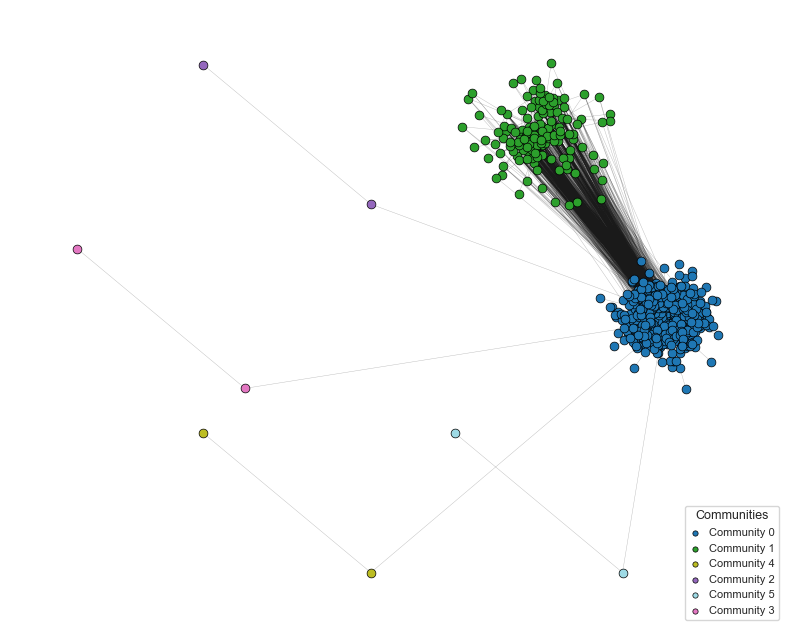

In [40]:
visualize_communities(G, method="leiden", resolution=0.3959)


Detected 6 communities using Louvain with resolution 0.3959.

=== COMMUNITY STATISTICS TABLE ===
community | num_nodes | % mature | % partner | median_views | avg_views | median_age_days | avg_age_days
--------------------------------------------------------------------------------------------------------
0         | 1776      | 35.1%    | 15.3%     | 6958.5       | 436557.6  | 1278.5          | 1298.0      
1         | 128       | 28.1%    | 5.5%      | 5600.5       | 47787.0   | 1878.0          | 1754.4      
2         | 2         | 0.0%     | 0.0%      | 6542.0       | 6542.0    | 396.0           | 396.0       
3         | 2         | 0.0%     | 0.0%      | 936.5        | 936.5     | 1634.0          | 1634.0      
4         | 2         | 50.0%    | 0.0%      | 2077.0       | 2077.0    | 522.0           | 522.0       
5         | 2         | 0.0%     | 0.0%      | 574.0        | 574.0     | 1570.0          | 1570.0      


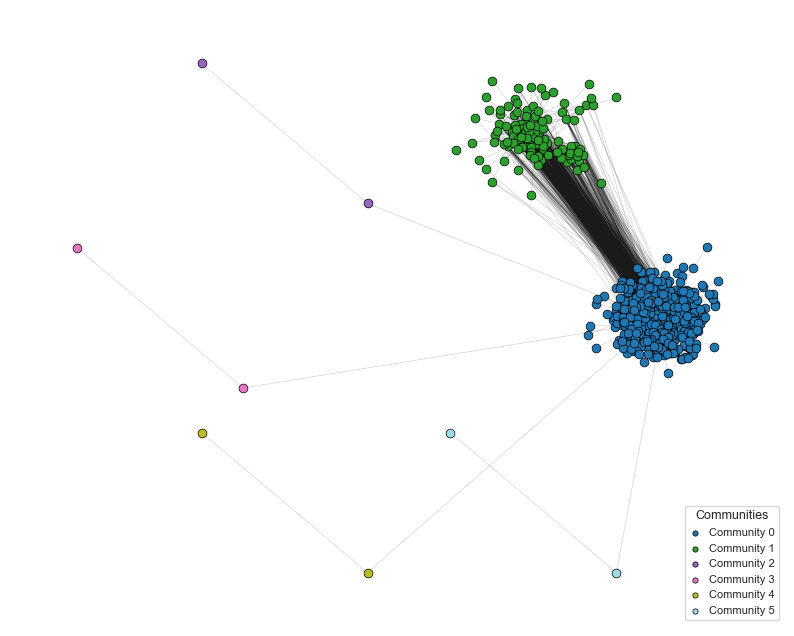

In [41]:
visualize_communities(G, method="louvain", resolution=0.3959)

##### Interpretation

Although this resolution setting gives the best custom metric scores for both Leiden and Louvain, the resulting communities are uneven and not very informative.

From the visualization:

- Two communities (blue and green) contain almost all nodes and form a dense, highly connected core.
- The remaining communities contain only a few isolated nodes each and sit far away from the center of the graph.
- These small clusters are essentially outliers.
- The massive size difference between clusters shows that, even though the algorithms score well on measures like conductance and coverage, the partition does not reflect any meaningful information.


##### Spectral


=== COMMUNITY STATISTICS TABLE ===
community | num_nodes | % mature | % partner | median_views | avg_views  | median_age_days | avg_age_days
---------------------------------------------------------------------------------------------------------
0         | 972       | 36.1%    | 13.3%     | 6421.0       | 205370.7   | 1401.0          | 1377.5      
1         | 13        | 0.0%     | 100.0%    | 18534438     | 29856228.2 | 2024            | 1945.8      
2         | 501       | 36.9%    | 13.8%     | 6103         | 172034.0   | 1022            | 1156.1      
3         | 35        | 40.0%    | 11.4%     | 10911        | 139281.5   | 1732            | 1689.6      
4         | 299       | 30.8%    | 15.1%     | 7910         | 218401.7   | 1422            | 1392.8      
5         | 20        | 35.0%    | 5.0%      | 4226.5       | 184233.0   | 2090.5          | 1953.0      
6         | 72        | 16.7%    | 25.0%     | 6463.5       | 467518.5   | 961.0           | 1110.5      


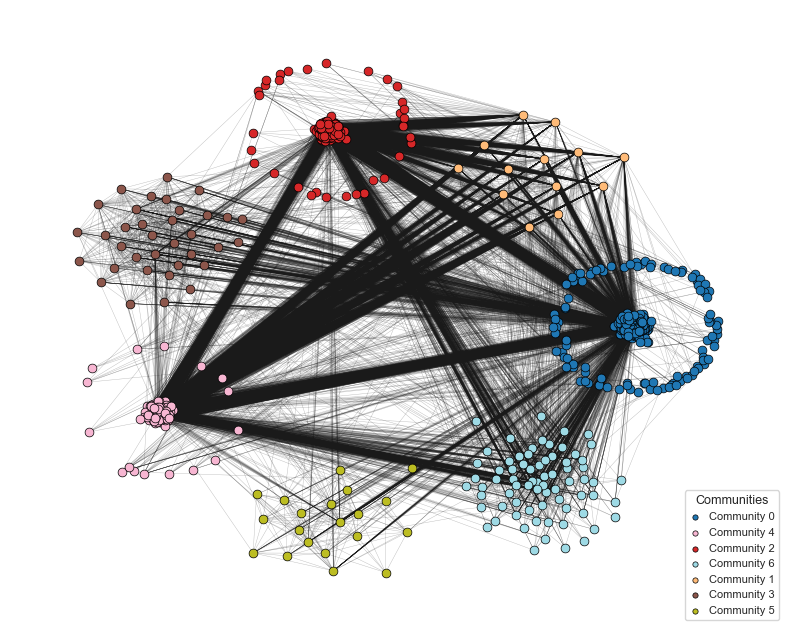

In [42]:
visualize_communities(G, method="spectral", k=7)

##### Insights Spectral

Spectral clustering creates Twitch comunities that are tightly connected on the inside and clearly separated from the rest of the network. The moderate conductance value means people in the same group mostly interact often with each other instead of outside users. The high density shows that these groups have lots of internal connections, making them feel like real communities.

A particularly interesting insight is the presence of special, highly distinctive clusters. The most striking being the community 1, composed entirely of Twitch Partners. This group is unusually small but extremely cohesive, with exceptionally high median and average view counts, long-established channels, and virtually no non-partner streamers mixed in. Spectral clustering isolates it cleanly because these creators share a very strong, exclusive interaction pattern typical of top-tier streamers. This makes the cluster stand out as an elite group within the network.

Another notable cluster is the group 3 with a very high mature/ adult profile percentage, where a large share of nodes represent older, long-running channels. These channels tend to have more stable audiences and deeper historical connections, which causes them to cluster together even if their view  aren't as extreme as the partner-only group.

A third interesting cluster is community 5, a small, low-view niche group that shows a unique behavioral signature compared to the rest of the network. Despite low median views, the channels in this cluster interact frequently among themselves, suggesting a tightly bonded niche community, maybe centered around a specific game genre, language, or streaming style, that is not very popular for other users.

##### Custom Louvain
After some experimentation of trial and error, the following resolution produced the most interpretable communities.

Detected 7 communities using Louvain with resolution 1.

=== COMMUNITY STATISTICS TABLE ===
community | num_nodes | % mature | % partner | median_views | avg_views | median_age_days | avg_age_days
--------------------------------------------------------------------------------------------------------
0         | 160       | 20.6%    | 18.8%     | 6849.0       | 249059.9  | 1083.0          | 1187.4      
1         | 15        | 13.3%    | 6.7%      | 774          | 13512.3   | 1261            | 1334.5      
2         | 603       | 48.9%    | 18.9%     | 12510        | 264620.4  | 1388            | 1376.9      
3         | 432       | 28.2%    | 10.4%     | 3687.5       | 241778.1  | 1005.5          | 1122.3      
4         | 49        | 44.9%    | 0.0%      | 5638         | 19038.4   | 832             | 1077.3      
5         | 203       | 26.1%    | 7.4%      | 5196         | 66719.2   | 1720            | 1644.3      
6         | 450       | 29.8%    | 16.4%     | 7075.5       | 102871

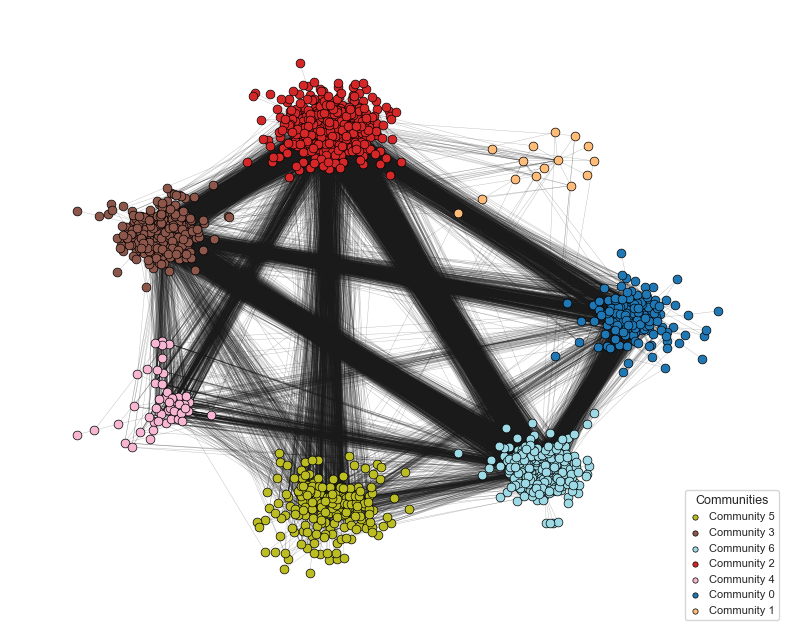

In [43]:
visualize_communities(G, method="louvain", resolution=1)

In [44]:
print_single_model_metrics(G, method="louvain", resolution=1.0)


=== COMMUNITY QUALITY METRICS ===
Algorithm    | Composite  | Conductance  | Density  | Coverage
----------------------------------------------------------------------
Louvain      | 0.3723     | 0.5345       | 0.0777   | 0.5428  


##### Insights of Louvain Communities
Louvain finds a dense core made of communities 2, 3, and 6 and a sparser periphery. Community 2 is the largest (603 users) and a central one: about 48.9% of its channels are flagged as mature (adult-oriented content) and 18.9% are partners, with a median of 12,510 views and an average of 264k. Users here are slightly older (median age 1388 days). Community 6 (450 users) has 29.8% mature and 16.4% partners, median views around 7075, but a huge average of 1.03M views, suggesting a few celebrity channels that attract many mutual followers. Community 3 (432 users) is also central but more mixed, with 28.2% mature and 10.4% partners; its median of 3,688 views versus an average of 242k points to many small accounts clustered around a few bigger ones. Community 0 (160 users) is a somewhat younger cluster (median 1083 days) with only 20.6% mature but a very high 18.8% partner rate and mid-level views (median 6849, average 249k), hinting at groups,possibly around specific games or teams, where partnership is common even without extreme view counts.

On the periphery, communities 1, 4, and 5 contain smaller, less connected circles that likely mix minor streamers and mostly-viewer accounts. Community 5 (203 users) is the oldest group (median 1720 days) but has just 7.4% partners and low views (median 5196, avg 66k), resembling a pocket of long-time yet relatively small channels. Community 4 is tiny (49 users), young (median 832 days), and stands out for 44.9% mature but 0% partners and low views (median 5638, avg 19k), suggesting a niche adult-oriented subculture sitting at the network’s edge, which mostly act as viewers and not streamers. Community 1 is the smallest (15 users), with only 13.3% mature, 6.7% partners, and the lowest engagement (median 774, avg 13.5k views).

##### Metrics Louvain

The metrics changed from Conductance 0.32 -> 0.53, Density 0.69 -> 0.077, and Coverage 0.96 -> 0.54, which means the new community detection is less tightly connected internally (lower density) and captures fewer of the graph’s total edges (lower coverage), but the communities are much better separated from each other (improvement in conductance). In simple terms, the previous community detection found a few very dense, very large groups that swallowed most of the network, but were not cleanly separated, making them less meaningful. The current community detection instead produces communities that are more evenly sized, less tangled with each other, and more interpretable.


##### Custom Leiden

Detected 8 communities using Leiden with resolution 1.

=== COMMUNITY STATISTICS TABLE ===
community | num_nodes | % mature | % partner | median_views | avg_views | median_age_days | avg_age_days
--------------------------------------------------------------------------------------------------------
0         | 480       | 34.0%    | 11.9%     | 5966.0       | 285960.7  | 1032.5          | 1138.3      
1         | 468       | 51.3%    | 20.5%     | 14868.5      | 300647.0  | 1401.5          | 1391.4      
2         | 366       | 29.0%    | 14.2%     | 6303.5       | 1131829.1 | 1538.0          | 1423.0      
3         | 341       | 24.0%    | 15.5%     | 4146         | 217169.7  | 1137            | 1187.2      
4         | 236       | 28.4%    | 8.5%      | 5193.0       | 63423.0   | 1724.0          | 1639.2      
5         | 17        | 11.8%    | 5.9%      | 691          | 12091.1   | 1265            | 1398.6      
6         | 2         | 0.0%     | 0.0%      | 6978.0       | 6978.0 

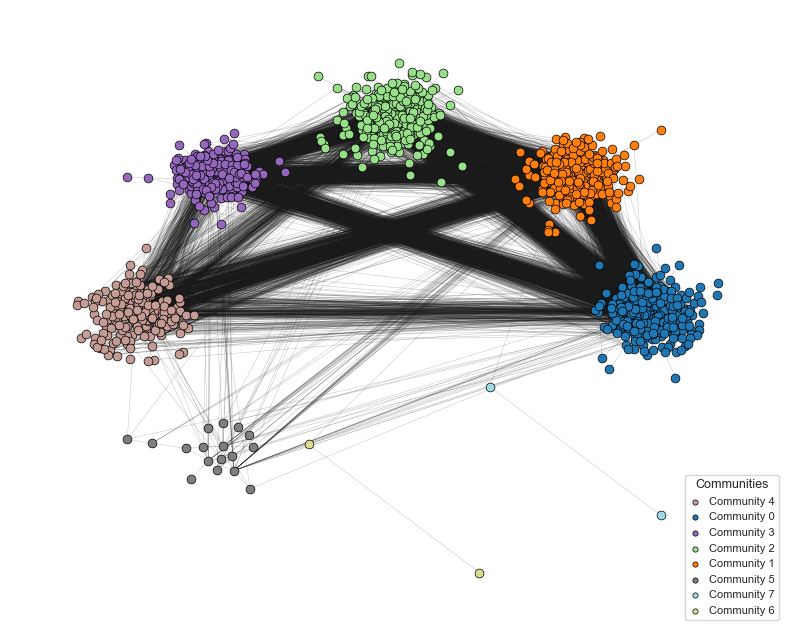

In [45]:
visualize_communities(G, method="leiden", resolution=1)


In [46]:
print_single_model_metrics(G, method="leiden", resolution=1.0)


=== COMMUNITY QUALITY METRICS ===
Algorithm    | Composite  | Conductance  | Density  | Coverage
----------------------------------------------------------------------
Leiden       | 0.4477     | 0.5036       | 0.2976   | 0.5327  


##### Insights of Leiden Communities

Among the 2 thousand users, five big communities (0–4) hold almost everyone, with three tiny ones (5–7) acting as outliers. Community 1 looks like the professional community: it contains many channels marked as mature/adult-oriented (51%), the highest partner rate (20.5%), strong median views (15k) and high averages, suggesting a core of established, adult-oriented streamers surrounded by their closely connected followers. Community 2 is also old and has a sizable share of mature-flagged channels (29%, with 14.2% partners), but a few very large channels push the average views above 1.1M while the median is only around 6.3k, indicating a small set of star streamers embedded in a broader mid-tier and viewer community.

Community 0 is the biggest group and seems to be the main mid-tier core: a medium share of mature-flagged channels (34%), moderate partner rate (11.9%), and median views around 6k, likely representing many reasonably active but not huge streamers plus their mutual-follow networks. Community 3 is similar in age, with slightly fewer mature-flagged channels (24%) and a solid partner share (15.5%) but lower typical views (4.1k), pointing to more niche or upcoming creators and their audiences. Community 4, by contrast, aggregates some of the oldest accounts (4.7 years) but has the lowest partner rate among the big groups (8.5%) and relatively low views, which fits a cluster of long-time but small-reach streamers and viewers who never coalesced around very popular channels. Overall, the partition highlights how different combinations of high-status streamers and ordinary users form particular communities.


##### Metrics Leiden

The new Leiden communities are much better separated from the rest of the graph. Simply, the new Leiden detection produces groups that are cleaner, less mixed, and easier to distinguish, without sacrificing much internal coherence. Compared to the new Louvain result, Leiden gives communities that are far denser and more structurally meaningful (density ***0.297 vs. 0.077*** which is a huge difference taking into account that we used the same resolution of 1), while maintaining similar separation and coverage-so Leiden’s communities are generally more cohesive and more interpretable than Louvain’s.

# Influence Maximization
Suppose we are a video game company that wants to advertise our new game. We want to choose which twitch users we can pay to sponsor the game
in their live streams, so that our reach is maximal. We expect that with a certain probability (P_influence) a twitch user that follows
another, that is playing the game, will start to play it too. If it's a streamer maybe he will start to do live streams on it,
while if it's a simple user, he might ask his favourite streamers to play that game. In both case, once a user is "infected" he will
try to "infect" its connected users.

Again this is a typical influence maximization.
For all details about the algorithm, please refer to what was done for the Europe email graph.

In [47]:
P_INFLUENCE = 0.05
MC_SIMULATIONS = 20
BUDGET = 5

seeds, final_spread = greedy(G, k=BUDGET, p=P_INFLUENCE, mc=MC_SIMULATIONS)
# seeds, final_spread = celf(G, k=BUDGET, p=P_INFLUENCE, mc=MC_SIMULATIONS)

print("-" * 50)
print(f"Optimal Seed Set S: {seeds}")
print(f"Estimated Total Spread: {final_spread:.2f} users, so {final_spread/G.number_of_nodes() * 100:.1f}% of the users")
print("-" * 50)



[Starting Greedy] Target seeds: 5 | Simulations: 20 | p: 0.05
  > Finding seed 1/5 (evaluating 1912 nodes)...


  0%|          | 0/1912 [00:00<?, ?it/s]

  > Seed 1 found: Node 530 (Marginal Gain: 1012.45) | Total Spread: 1012.45
  > Finding seed 2/5 (evaluating 1911 nodes)...


  0%|          | 0/1911 [00:00<?, ?it/s]

  > Seed 2 found: Node 760 (Marginal Gain: 5.80) | Total Spread: 1018.25
  > Finding seed 3/5 (evaluating 1910 nodes)...


  0%|          | 0/1910 [00:00<?, ?it/s]

  > No further node could improve the spread.
--------------------------------------------------
Optimal Seed Set S: [530, 760]
Estimated Total Spread: 1018.25 users, so 53.3% of the users
--------------------------------------------------


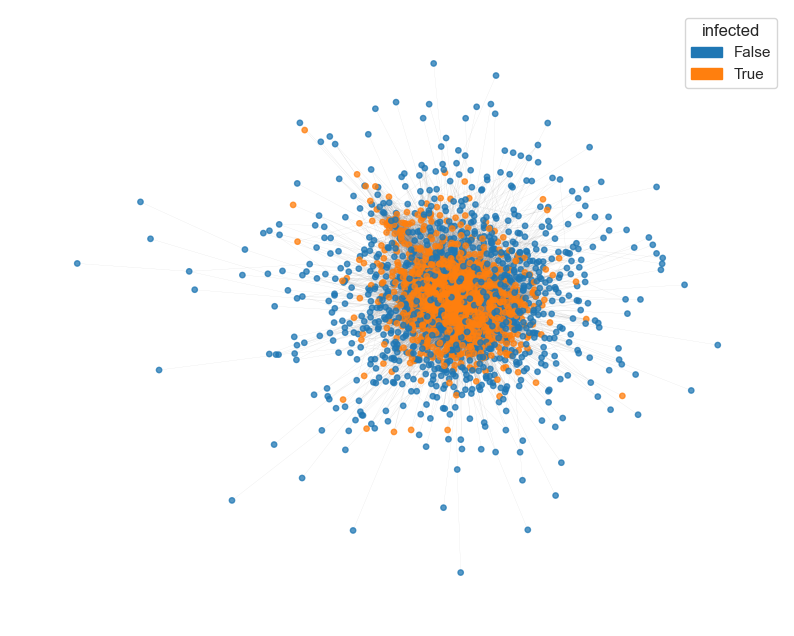

Percentage of infected nodes 50.4%
Initial seed: [530, 760]


In [48]:
G_infected = simulate_and_tag_infection(G, seeds, p=P_INFLUENCE)
generic_show_static(G_infected, node_color='infected', node_size=15, k_core=0, width=10, height=8)
infected_count = sum(1 for node, data in G_infected.nodes(data=True) if data.get('infected') is True)
infected_percentage = infected_count / G_infected.number_of_nodes() * 100
print(f"Percentage of infected nodes {infected_percentage:.1f}%")
print(f"Initial seed: {seeds}")